# PROJET PYTHON DATA SCIENTIST

## Introduction

### Mise en contexte 


Dans le cadre du projet Python pour un Data Scientist, nous avons choisi de travailler sur la compétition Kaggle suivante : __Statoil/C-CORE Iceberg Classifier Challenge__ (https://www.kaggle.com/c/statoil-iceberg-classifier-challenge). Cette compétition a été lancée par Statoil, compagnie pétrolière Norvégienne, aujourd'hui classée parmi les plus gros fournisseurs mondiaux de pétrole brut ; en partenariat avec C-CORE, une entreprise de R&D Canadienne proposant des solutions technologiques innovantes à d'importants clients travaillant dans le secteur de l'énergie. 

L'objectif de cette compétition est de pouvoir différencier des __icebergs__ de __bateaux__ à partir d'images prises par un satellite situé à 600km d'altitude. Statoil souhaite utiliser l'immense base d'images satellites dont dispose C-CORE dans le but de construire un modèle robuste de classification. Le machine learning se veut ici être une méthode d'analyse plus rapide (par rapport à l'analyse manuelle des objets), visant à mieux anticiper les icebergs à risques et ainsi réduire les coûts associés au maintien des conditions de sécurité dans les stations pétrolières off-shore de Statoil.


### Problématique

__**Dans quelle mesure sommes-nous capables de construire un modèle de reconnaissance d'objets (iceberg/bateau) à partir d'images satellites ? Quels critères discriminants sommes-nous capables d'extraire ? Le modèle est-il utilisable dans le contexte de la compétition Kaggle ?**__

On se demandera notamment comment améliorer les prédictions d'un modèle naïf qui utiliserait la base brute. Une grande partie du travail consistera à trouver et extraire de la base des variables d'interêt permettant une différenciation plus facile entre les objets. Il s'agira donc d'améliorer le modèle significativement; on se demandera, étant donné nos résultats, si les performances sont assez élevées pour pouvoir utiliser le modèle dans le contexte industriel du problème. Il s'agit aussi en partie d'un problème de traitement d'image, on travaillera sur les images satellites à notre disposition parfois très bruitées et souvent non interprétables visuellement sans traitement.

Le notebook suivant tente de répondre à ces questions.

In [1]:
from jyquickhelper import add_notebook_menu
add_notebook_menu()

## Quelques éléments théoriques

Le satellite dont il est question est un satellite Sentinel-1 sur lequel une antenne envoie des signaux radars. Chaque signal radar émis dans une direction particulière est réfléchi par la surface. Cet écho est capté, par la même antenne, quelques dizièmes de seconde après émission. L'amplitude, la phase et l'intensité du signal reçu sont enregistrées afin de reconstruire une image. Cette intensité dont il est question est appelée "backscattering coefficient" ou coefficient de réflectance $\sigma$ et s'exprime en décibel (dB). Il mesure l'intensité de la portion de signal directement réfléchie vers l'antenne par unité de surface. Nous pouvons d'ailleurs en citer certaines propriétés, utiles pour la suite : 

* les images plus sombres correspondent à des zones/matières ayant un faible coefficient $\sigma$ (seule une faible fraction du signal émis est captée directement) et inversement ;

* les surfaces plates reflétant pas ou peu d'énergie apparaîtront sombres, comme l'océan par temps calme ; 

* inversement, une mer agitée donnera une image globalement plus claire et "bruitée" ;

* des matériaux différents transmettront le signal émis avec plus ou moins d'intensité (en particulier de la glace, de l'eau ou de l'acier).

<img src = "http://gsp.humboldt.edu/olm_2015/Courses/GSP_216_Online/images/sartable.png", width = 400, height = 70, title = "Réflectance de différentes surfaces">

L'angle d'incidence $\theta$ est également pris en compte : il s'agit de l'angle formé par la direction de l'antenne et une perpendiculaire à la surface terrestre. De manière générale, le coefficient $\sigma$ est plus élevé pour de faibles angles d'incidence et inversement (si le satellite se situe à la normale, la probabilité de retour est plus élevée).


<img src = "https://sentinel.esa.int/image/image_gallery?img_id=283954&t=1348125212390", width = 500, height = 200,title = "Principe de fonctionnement du satellite Sentinel-1">

L'image ci-dessus résume le principe de fonctionnemenet du stallite Sentinel-1. Dans notre cas, le mode d'acquisition est le "Wave mode" : chaque image couvre une portion d'océan de taille ± 5km x 5km et les angles d'incidences sont plus élevés. 

Dernière chose dont nous devons parler, la polarisation. Le satellite Sentinel-1 transmet en réalité deux types de signaux polarisés : soit verticalement (V) soit horizontalement (H). Dans notre base il s'agira d'une image (HV) - polarisation horizontale à l'émission, verticale à la réception, **et** (HH) - polarisation horizontale à l'émission et à la réception.
<img src = "http://envisat.esa.int/handbooks/asar/aux-files/ephimg-22802493.gif", title = "Polarisation HV">

## Aperçu des données

In [1]:
import warnings
warnings.filterwarnings("ignore") # On désactive les avertissements pour faciliter la lecture du notebook

import pandas

# La fonction refresh permet de charger la base de données
def refresh():
    path_data = "/Users/bfiliot/Google Drive/KAGGLE/train.json"
    data = pandas.read_json(path_data)
    return (data)

data = refresh()
data.tail()

,band_1,band_2,id,inc_angle,is_iceberg
1599,"[-30.999878, -29.976866, -28.233906, -29.50732...","[-27.847719, -28.233864, -24.712077999999998, ...",04e11240,na,0
1600,"[-25.31155, -26.511555, -28.694487, -27.180115...","[-29.563713, -28.290375, -26.839405, -28.29046...",c7d6f6f8,na,0
1601,"[-18.141895, -18.141844, -19.01737, -19.701599...","[-25.305355, -29.387701, -28.963863, -26.16023...",bba1a0f1,na,0
1602,"[-22.455633, -25.794661, -26.954567, -22.83354...","[-26.070356, -22.093737, -21.577662, -24.53376...",7f66bb44,na,0
1603,"[-19.909191, -20.678406, -20.208834, -18.42441...","[-24.44487, -24.956001, -27.722103, -26.078417...",9d8f326c,na,0


In [3]:
import warnings
warnings.filterwarnings("ignore") # On désactive les avertissements pour faciliter la lecture du notebook

import pandas

# La fonction refresh permet de charger la base de données
def refresh():
    path_data = r"C:\Users\quent\Desktop\2A_ENSAE\Python Data Scientist\Projet\data\processed\train.json"
    data = pandas.read_json(path_data)
    return (data)

data = refresh()
data.tail()

,band_1,band_2,id,inc_angle,is_iceberg
1599,"[-30.999878, -29.976866, -28.233906, -29.50732...","[-27.847719, -28.233864, -24.712077999999998, ...",04e11240,na,0
1600,"[-25.31155, -26.511555, -28.694487, -27.180115...","[-29.563713, -28.290375, -26.839405, -28.29046...",c7d6f6f8,na,0
1601,"[-18.141895, -18.141844, -19.01737, -19.701599...","[-25.305355, -29.387701, -28.963863, -26.16023...",bba1a0f1,na,0
1602,"[-22.455633, -25.794661, -26.954567, -22.83354...","[-26.070356, -22.093737, -21.577662, -24.53376...",7f66bb44,na,0
1603,"[-19.909191, -20.678406, -20.208834, -18.42441...","[-24.44487, -24.956001, -27.722103, -26.078417...",9d8f326c,na,0


Notre base d'entraînement est constituée de 1604 observations caractérisées par 5 champs de données (band_1, band_2, id, inc_angle, is_iceberg). 
* Les variables **band_1** et **band_2** sont des images (75 par 75 pixels) sous forme de listes de 5625 valeurs **en décibels (dB)**. Elles correspondent respectivement aux polarisations HH et HV (voir paragraphe précédent) ; 
* **id** est l'identifiant associé à la capture des deux images radar, cette variable n'est pas utile à l'étude et ne nous servira pas à la création des modèles ;
* **inc_angle** est l'angle d'incidence au moment de l'émission du signal (pour cette variable, environ 200 données manquantes) ; 
* **is_iceberg** est un booléen égal à 1 si l'objet est un iceberg, 0 sinon.

La base de données est relativement équilibrée, sur les 1604 objets, 753 sont des icebergs, 851 sont des bateaux (47% / 53%). Voici, pour exemple, quelques images issues de la base.

In [2]:
import matplotlib.pyplot as plt
import numpy as np
from PIL import Image

plt.style.use('ggplot')

ex_ice = data[data.is_iceberg==1].sample(n=100) # On extrait quelques observations d'icebergs
ex_shi = data[data.is_iceberg==0].sample(n=100) # On extrait quelques observations de bateaux

La fonction suivante, __to_RGB__, permet de transformer les images pour les afficher en couleur, les différentes couleurs correspondent aux différents niveaux d'intensité réfléchis. Les objets les plus réfléchissants (en jaune et rouge) sont en particulier les bateaux et les icebergs, la mer est le plus souvent en bleu (plus faibles niveaux d'intensité) mais la couleur dépend en partie de l'angle avec lequel les photos sont prises, et de l'état d'agitation de la mer.

In [3]:
def to_RGB(arr):
    normalized = (arr-np.min(arr))/(np.max(arr)-np.min(arr))
    im = Image.fromarray(plt.cm.jet(normalized, bytes=True))
    im = im.resize((300, 300), Image.ANTIALIAS)
    return (im)

### Des icebergs

En polarisation HH

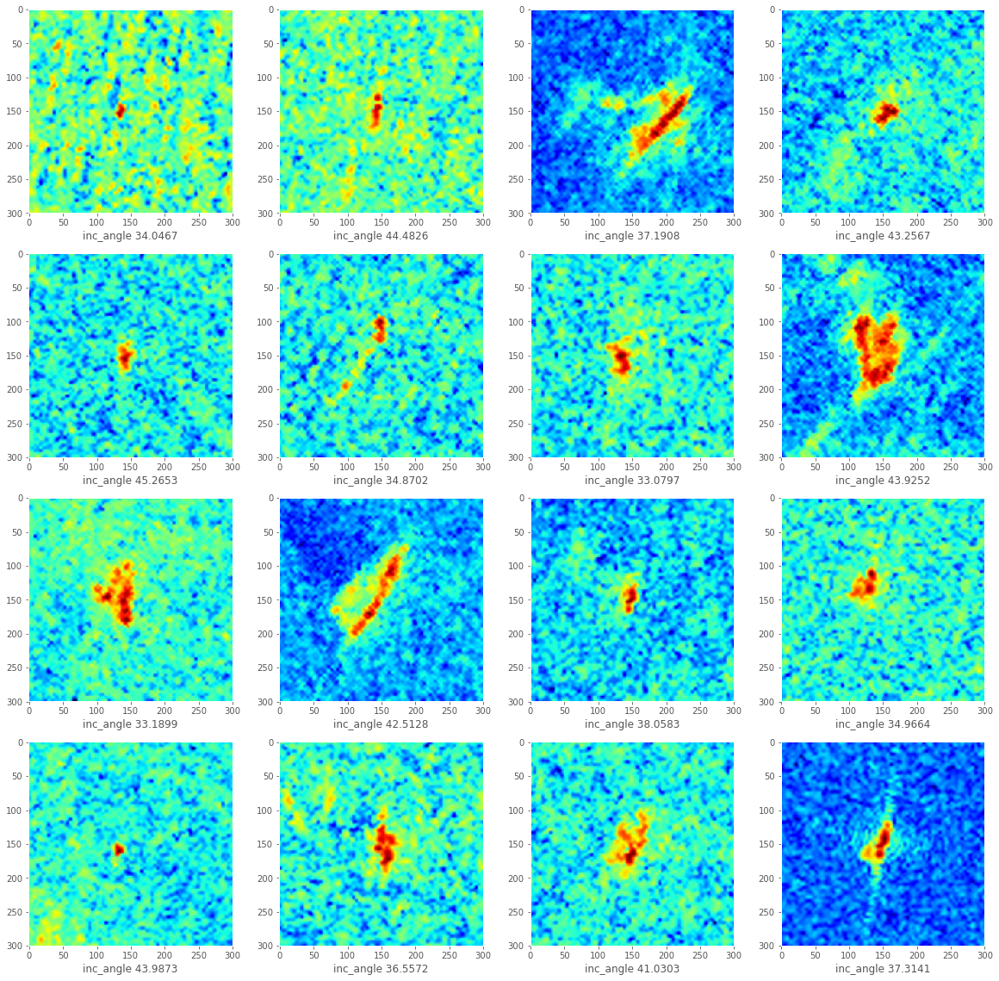

In [4]:
fig = plt.figure(figsize = (20,20))

for i in range(16):
    ax = fig.add_subplot(4,4,i+1)
    arr = np.reshape(np.array(ex_ice.iloc[i,0]),(75,75))
    im = to_RGB(arr)
    ax.grid(False)
    ax.imshow(im)
    ax.set_xlabel("inc_angle "+str(ex_shi.iloc[i,3]))
    
plt.show()

En polarisation HV

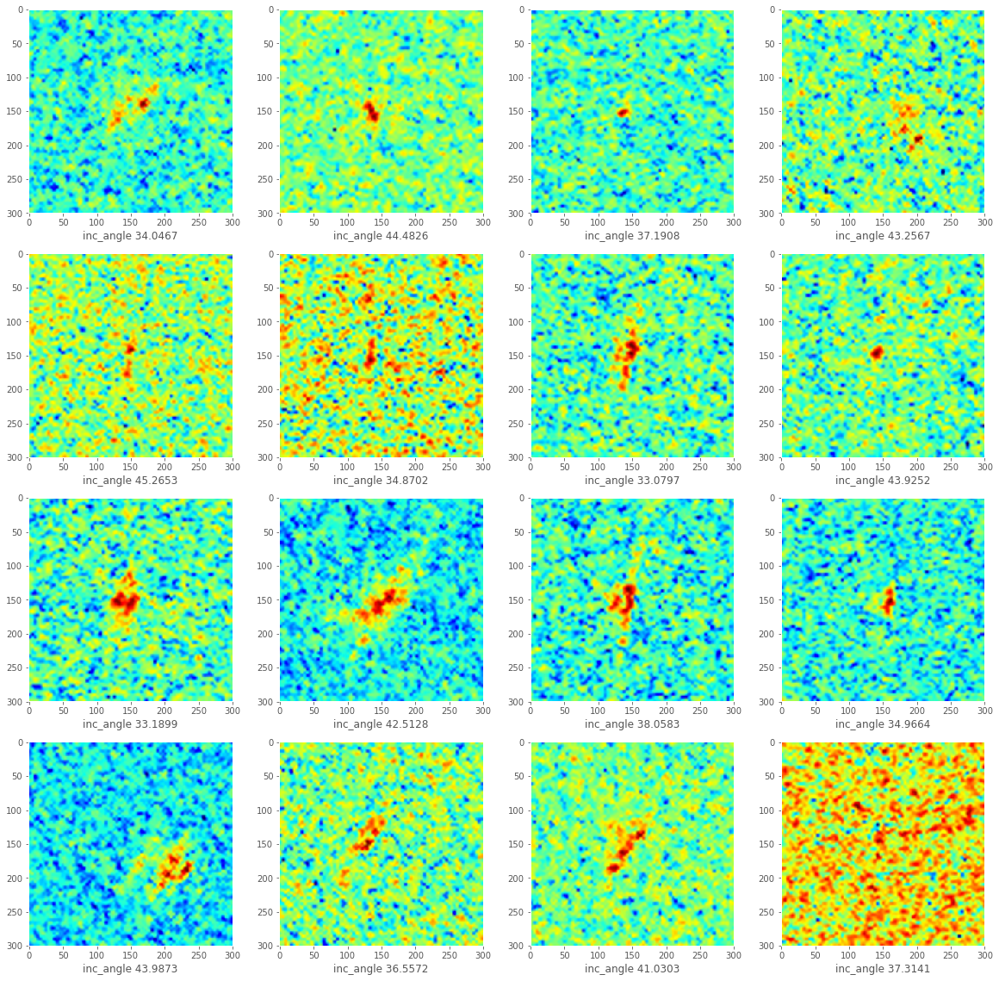

In [8]:
fig = plt.figure(figsize = (20,20))

for i in range(16):  
    ax = fig.add_subplot(4,4,i+1)
    arr = np.reshape(np.array(ex_ice.iloc[i+20,1]),(75,75))
    im = to_RGB(arr)
    ax.grid(False)
    ax.imshow(im)
    ax.set_xlabel("inc_angle "+str(ex_shi.iloc[i,3]))

plt.show()

### Des bateaux

En polarisation HH

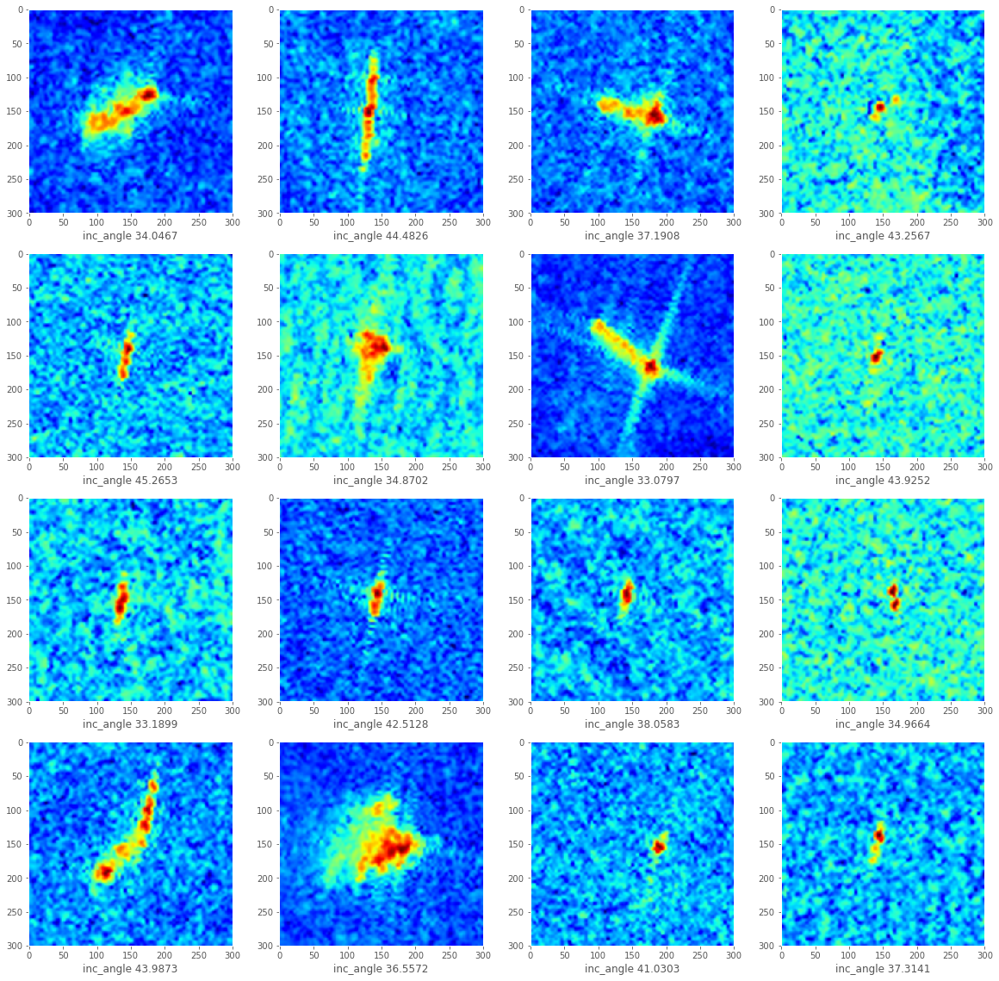

In [9]:
fig = plt.figure(figsize = (20,20))

for i in range(16):  
    ax = fig.add_subplot(4,4,i+1)
    arr = np.reshape(np.array(ex_shi.iloc[i,0]),(75,75))
    im = to_RGB(arr)
    ax.grid(False)
    ax.imshow(im)
    ax.set_xlabel("inc_angle "+str(ex_shi.iloc[i,3]))

plt.show()

En polarisation HV

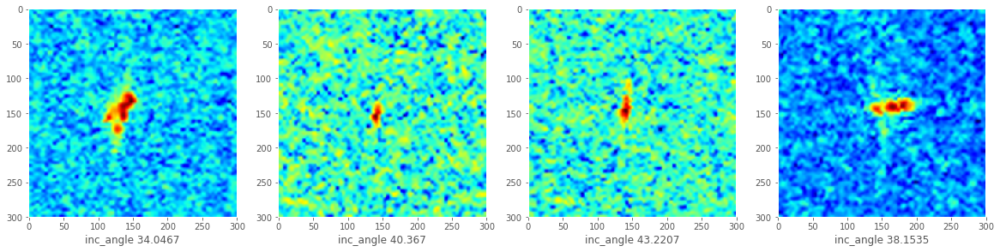

In [35]:
fig = plt.figure(figsize = (20,20))

for i in range(4):  
    ax = fig.add_subplot(2,4,i+5)
    arr = np.reshape(np.array(ex_shi.iloc[i,1]),(75,75))
    im = to_RGB(arr)
    ax.grid(False)
    ax.imshow(im)
    ax.set_xlabel("inc_angle "+str(ex_shi.iloc[i,3]))

plt.show()

Le premier constat est qu'on ne sait pas différencier les bateaux des icebergs visuellement, il est aussi très difficile d'identifier les contours exacts des objets. Sur certaines images, il est impossible de repérer la position de l'objet. Il est néanmoins très intéressant d'observer ces images, on s'inspirera des différences visuelles pour trouver de nouvelles variables. Visuellement les informations apportées par les deux polarisations sont assez similaires, il semble aussi que la polaristion HH produit des images plus nettes.

## Premier modèle naïf

Dans un premier temps nous essayons de générer un modèle avec les données brutes. Nous trouvons intéressant de présenter ce modèle pour plusieurs raisons. En premier lieu cela permet de cerner les difficultés liées à l'exploitation du modèle, cela justifie aussi la recherche de nouvelles variables. On s'attend, de plus, à des résultats médiocres dû très certainement à l'overfitting d'où le besoin de réduire la dimension des features. De mauvais résultats sur les données brutes justifient aussi le travail sur notre problématique et sur la base de données.

### Base brute

In [ ]:
data = refresh()

In [10]:
# On supprime les observations avec des données manquantes
data['inc_angle'] = pandas.to_numeric(data['inc_angle'],errors='coerce')
data = data.dropna()
n = data.shape[0]

In [11]:
# On vectorise la base
b1 = np.array(data["band_1"])
b2 = np.array(data["band_2"])
ang = np.array(data["inc_angle"])
X = [b1[i]+b2[i]+[ang[i]] for i in range(n)]
Y = np.array(data["is_iceberg"])
X = np.array(X) # X contient toutes les données de la base

### Apprentissage

Dans cette partie, on crée un premier modèle, nous n'insistons pas sur l'apprentissage ni la validation du modèle, on s'y intéressera plus particulièrement dans les sections suivantes, l'idée est simplement d'obtenir un ordre de grandeur des performances d'un modèle "brut".

In [ ]:
from sklearn import preprocessing
from sklearn.model_selection import train_test_split

In [12]:
X = preprocessing.scale(X) # On normalise les observations
X_train, X_test, y_train, y_test = train_test_split(X, Y, test_size=0.25) # Séparation train/test

Essais sur quelques classifieurs :

In [13]:
from sklearn.model_selection import cross_val_score
best_c=None
best_s=0

# SVM
from sklearn import svm
for i in ['linear','poly','rbf','sigmoid']:
    clf = svm.SVC(kernel=i, C=1)
    scores = cross_val_score(clf, X_train, y_train, cv=5) # cross-validation
    print("Accuracy: %0.2f (+/- %0.2f)" % (scores.mean(), scores.std() * 2))
    if scores.mean()>best_s:
        best_s = scores.mean()
        best_c = clf

# NN
from sklearn.neural_network import MLPClassifier
for i in range(5):
    clf = MLPClassifier(solver='lbfgs', hidden_layer_sizes=(10*(i+1),10*(i+1)), random_state=1)
    scores = cross_val_score(clf, X_train, y_train, cv=5) # cross-validation
    print("Accuracy: %0.2f (+/- %0.2f)" % (scores.mean(), scores.std() * 2))
    if scores.mean()>best_s:
        best_s=scores.mean()
        best_c=clf
        
# KNN
from sklearn.neighbors import KNeighborsClassifier
clf = KNeighborsClassifier(n_neighbors=3)
scores = cross_val_score(clf, X_train, y_train, cv=5) # cross-validation
print("Accuracy: %0.2f (+/- %0.2f)" % (scores.mean(), scores.std() * 2))
if scores.mean()>best_s:
    best_s=scores.mean()
    best_c=clf

Accuracy: 0.72 (+/- 0.05)
Accuracy: 0.59 (+/- 0.04)
Accuracy: 0.74 (+/- 0.06)
Accuracy: 0.56 (+/- 0.07)
Accuracy: 0.75 (+/- 0.05)
Accuracy: 0.75 (+/- 0.04)
Accuracy: 0.74 (+/- 0.03)
Accuracy: 0.76 (+/- 0.02)
Accuracy: 0.75 (+/- 0.04)
Accuracy: 0.69 (+/- 0.04)


In [14]:
best_c

MLPClassifier(activation='relu', alpha=0.0001, batch_size='auto', beta_1=0.9,
       beta_2=0.999, early_stopping=False, epsilon=1e-08,
       hidden_layer_sizes=(40, 40), learning_rate='constant',
       learning_rate_init=0.001, max_iter=200, momentum=0.9,
       nesterovs_momentum=True, power_t=0.5, random_state=1, shuffle=True,
       solver='lbfgs', tol=0.0001, validation_fraction=0.1, verbose=False,
       warm_start=False)

In [18]:
best_c.fit(X_train,y_train)
print("Accuracy calculée sur la base d'entrainement : %0.2f"% best_c.score(X_train,y_train))
print("Accuracy calculée sur la base test : %0.2f"% best_c.score(X_test,y_test))

Accuracy calculée sur la base d'entrainement : 1.00
Accuracy calculée sur la base test : 0.76


Le modèle souffre clairement d'overfitting, on s'y attendait bien sûr, l'étude des images satellites ne peut être satisfaite en utilisant tous les pixels comme features, le nombre de variables est alors bien trop élévé (il est très grand devant le nombre d'observations). Un autre indice de l'overfitting est l'accuracy calculée sur la base d'entraînement qui est ici maximale (1.00). Les classifieurs apprennent parfaitement des données mais ont un pouvoir de généralisation très faible. L'accuracy des modèles ainsi obtenus varie autour de __0.75__. Evidemment trop de features n'ont pas d'intêret pour la détermination du modèle.

## Traitement des images 

La première étape de traitement de la base a consisté en le traitement des images **band_1** et **band_2**. Seule une faible partie de l'image est utile pour notre apprentissage, à savoir l'objet - en général centré - et ses caractèristiques, l'eau environnante est un surplus d'information très certainement inutile au problème.

In [36]:
data = refresh()

### Réduction du bruit / Extraction des objets

Il est très important de pouvoir extraire les objets de l'image et pour cela il nous faut pouvoir les différencier de l'eau qui les entoure. On cherche ici à améliorer le contraste entre l'eau et l'objet bateau/iceberg en travaillant sur l'image. Le lissage des images via différents filtres est un outil qui va nous permettre une étude plus simple des objets. Certaines images prises par temps calme / faible angle d'incidence, sont assez facilement exploitables puisque le contraste de couleur entre l'eau et l'objet est élevé. D'autres prises par mer agitée et d'importants angles d'incidence sont plus délicates à exploiter puisque l'objet est difficilement différentiable de la mer. Le bruit, dû à des reflets (maximums locaux d'intensité) entourant les objets, est prépondérant sur toutes les images de la base et n'est absolument pas pertinent dans la mesure où il ne donne aucune information sur la nature de l'objet.

La figure suivante illustre la présence du "bruit" sur 5 images de bateaux (polarisation HH) à l'aide des histogrammes d'intensités (décibels en abscisse, log(fréquence) en ordonnée). 

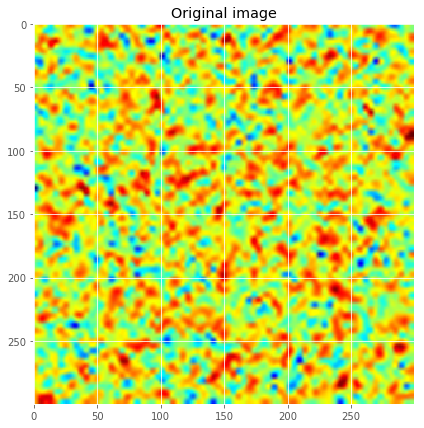

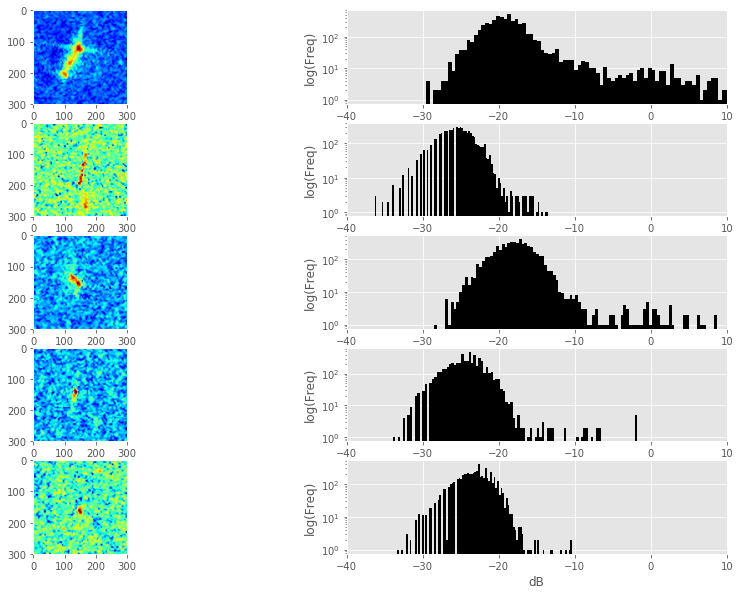

In [11]:
ex_ice = data[data.is_iceberg==1].sample(n=100)
ex_shi = data[data.is_iceberg==0].sample(n=100)

fig = plt.figure(figsize=(15,10))

for i in [0,2,4,6,8]:
    arr = np.reshape(np.array(ex_shi.iloc[i,0]),(75,75))
    im = to_RGB(arr)
    ax = fig.add_subplot(5,2,i+1)
    ax.grid(False)
    ax.imshow(im)
    hist = arr.ravel()
    ax = fig.add_subplot(5,2,i+2)
    ax.hist(hist, bins = 100, color = "black")
    ax.set_yscale('log')
    ax.set_xlim([-40,10])
    ax.set_xlabel("dB")
    ax.set_ylabel("log(Freq)")

plt.show()

La moyenne de ces histogrammes se situe généralement autour de -20 dB, intensité moyenne de l'océan. On note également, de manière plus ou moins prononcée, la présence d'une "queue de distribution" à droite, représentant les valeurs d'intensité prises par l'objet. Dans un premier temps nous ne nous occupons pas des traînées (observées davatange sur les images de bateaux), juste du bruit. Nous cherchons donc à l'homogénéiser de sorte à mieux pouvoir distinguer les objets du fond pour les images fort bruitées. En somme, nous cherchons à diminuer la largeur des histogrammes et faire apparaître plus clairement deux groupes : l'un pour le bruit, l'autre pour l'bojet. Pour cela, le module **skimage** offre une mutlititude de filtres et de méthode de débruitage. Voici quelques exemples ci-après.

In [12]:
from PIL import Image
import skimage.filters, skimage.exposure, skimage.restoration, skimage.morphology, skimage.measure, skimage.measure, skimage.segmentation
from scipy.ndimage import gaussian_filter
from skimage.filters.rank import median
from skimage import img_as_float


In [13]:
def maxPoolingLayer(arr, shape): 
    # réduit la taille de l'image (75x75 -> shape x shape) en la balayant selon
    # des carrés de taille (75/shape x 75/shape) et en y prenant le maximum à chaque fois
    sh = shape,arr.shape[0]//shape,shape,arr.shape[1]//shape
    y = arr.reshape(sh).max(-1).max(1)
    return (to_RGB(np.reshape(np.array(y.flatten()),(shape,shape))))

def meanPoolingLayer(arr, shape):
    # idem avec la moyenne
    sh = shape,arr.shape[0]//shape,shape,arr.shape[1]//shape
    y = arr.reshape(sh).mean(-1).mean(1)
    return (to_RGB(np.reshape(np.array(y.flatten()),(shape,shape))))

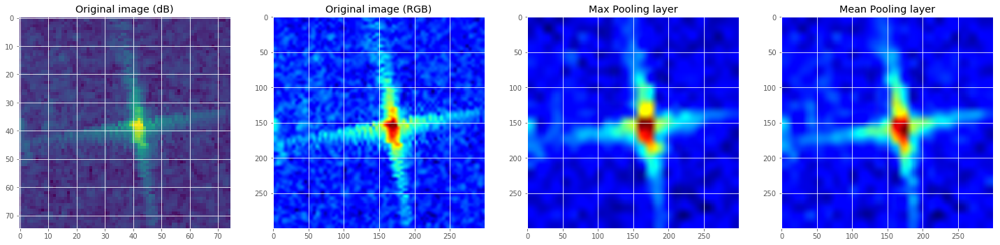

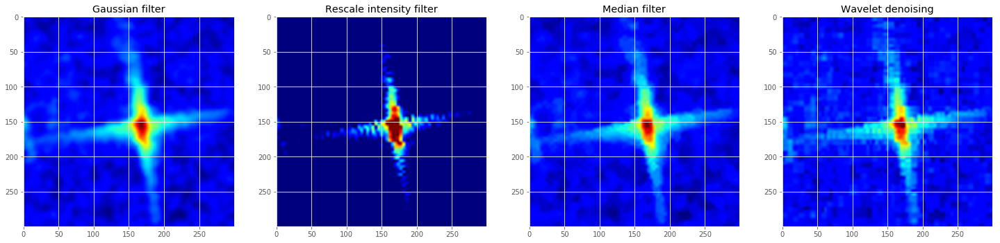

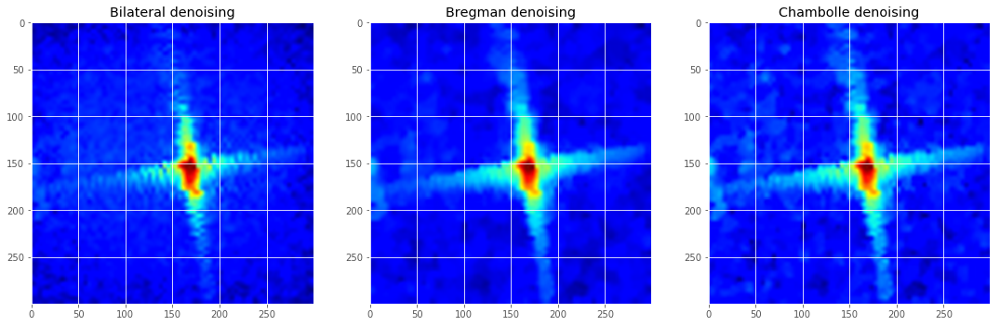

In [14]:
arr = np.reshape(np.array(data[data.is_iceberg==0].iloc[5,0]),(75,75)) # transformation de la variable band_1
normalized = (arr-np.min(arr))/(np.max(arr)-np.min(arr)) # normalisation de l'intensité entre 0 et 1
arr_uint = np.uint8(255*normalized) # conversion en uint8
im = to_RGB(arr) # conversion en RGB

plt.figure(figsize = (25,25))
plt.subplot(1,4,1)
plt.imshow(arr)
plt.title("Original image (dB)")
plt.subplot(1,4,2)
plt.imshow(im)
plt.title("Original image (RGB)")
plt.subplot(1,4,3)
im1 = maxPoolingLayer(arr, 25)
plt.imshow(im1)
plt.title("Max Pooling layer")
plt.subplot(1,4,4)
im1 = meanPoolingLayer(arr, 25)
plt.imshow(im1)
plt.title("Mean Pooling layer")

plt.figure(figsize = (25,25))
plt.subplot(1,4,1)
img1 = skimage.filters.gaussian(arr, sigma=1)
plt.imshow(to_RGB(img1))
plt.title("Gaussian filter")

plt.subplot(1,4,2)
arr_float = 1.0 * arr
arr_rescale = skimage.exposure.rescale_intensity(arr_float, in_range=(-10, 15))
plt.imshow(to_RGB(arr_rescale))
plt.title("Rescale intensity filter")

plt.subplot(1,4,3)                                             
med = median(arr_uint, skimage.morphology.disk(2))
plt.imshow(to_RGB(med))                                  
plt.title("Median filter")

plt.subplot(1,4,4)                                          
img2 = skimage.restoration.denoise_wavelet(arr_uint, multichannel = False, sigma = 0.03)
plt.imshow(to_RGB(img2))
plt.title("Wavelet denoising")

plt.figure(figsize = (25,25))

plt.subplot(1,4,1)
denoised_1 = skimage.restoration.denoise_bilateral(arr_uint, multichannel=False, sigma_color=0.1, sigma_spatial=10) 
plt.imshow(to_RGB(denoised_1))
plt.title("Bilateral denoising")

plt.subplot(1,4,2)
denoised_2 = skimage.restoration.denoise_tv_bregman(arr, weight = 0.4, max_iter=100, eps=0.001, isotropic=True)
plt.imshow(to_RGB(denoised_2))
plt.title("Bregman denoising")

plt.subplot(1,4,3)
denoised_3 = skimage.restoration.denoise_tv_chambolle(arr, weight=0.8, eps=0.0002, n_iter_max=200, multichannel=False)
plt.imshow(to_RGB(denoised_3))
plt.title("Chambolle denoising")

plt.show()

Maintenant, quels filtres choisir ? La réponse à cette question est purement empirique (et pratique en terme de temps d'exécution). Nous souhaitons éliminer le bruit tout en conservant une bonne approximation de l'allure de l'objet. Après avoir testé chacun de ces filtres sur nos images (band_1 et band_2), ce pour des paramètres différents, nous avons retenu le filtre médian, le filtre gaussien ainsi que le filtre bilatéral.

#### Seuillage

Nous souhaitons après filtrage, délimiter les objets et l'eau qui les entoure. Pour cela on détermine des seuils d'intensités en dessous desquels les pixels étudiés sont de l'eau. Grâce à cela on pourra harmoniser la mer sur les images.

##### Seuillage automatique

Dans un premier temps nous nous sommes intéressés aux seuils calculés à partir des histogrammes "histogram-based thresholds", selon plusieurs méthodes disponibles sous skimage.filters. Pour de bonnes images (peu bruitée, objets assez larges), les seuils proposés sont très satisfaisants, voir l'exemple suivant. 

In [15]:
from skimage.filters import try_all_threshold

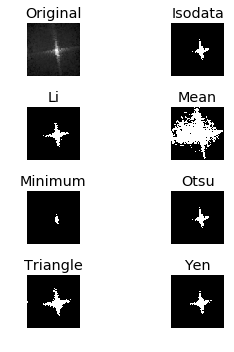

In [16]:
arr = np.reshape(np.array(data[data.is_iceberg==0].iloc[5,0]),(75,75))
normalized = (arr-np.min(arr))/(np.max(arr)-np.min(arr)) # normalisation de l'intensité entre 0 et 1
arr_uint = np.uint8(255*normalized)
denoised_bilateral = skimage.restoration.denoise_bilateral(arr_uint, multichannel=False, sigma_color=0.1, sigma_spatial=10)
imgBL = denoised_bilateral
    
fig, ax = try_all_threshold(imgBL, figsize=(5, 5), verbose=False)

plt.show()

Pour des images très bruitées comme il en existe un certain nombre dans notre jeu de données, les méthodes précédentes trouvent leur limite.

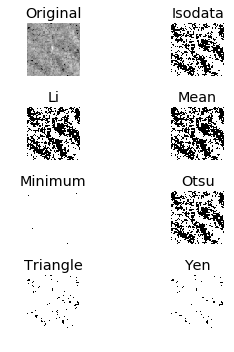

In [17]:
arr = np.reshape(np.array(data[data.is_iceberg==0].iloc[35,0]),(75,75))
normalized = (arr-np.min(arr))/(np.max(arr)-np.min(arr)) # normalisation de l'intensité entre 0 et 1
arr_uint = np.uint8(255*normalized)
denoised_bilateral = skimage.restoration.denoise_bilateral(arr_uint, multichannel=False, sigma_color=0.1, sigma_spatial=10)
imgBL = denoised_bilateral
    
fig, ax = try_all_threshold(imgBL, figsize=(5, 5), verbose=False)

plt.show()

##### Seuillage manuel

Pour pallier ce problème, nous avons directement imposé un seuil égal à 0.6, après filtrage et normalisation. 

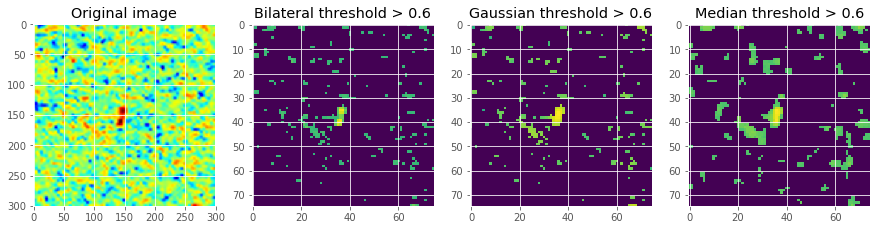

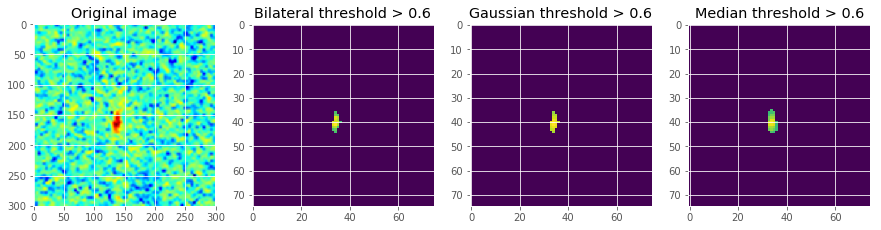

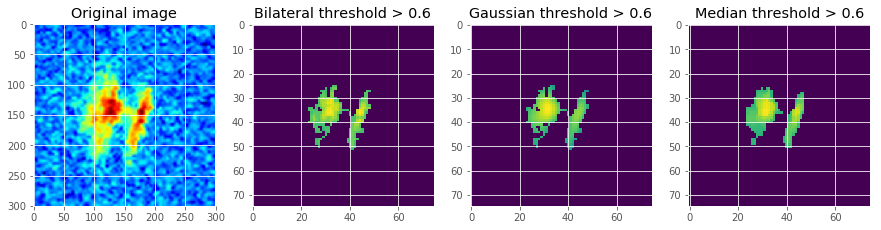

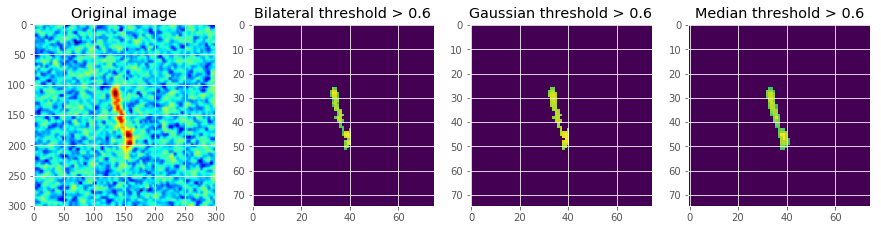

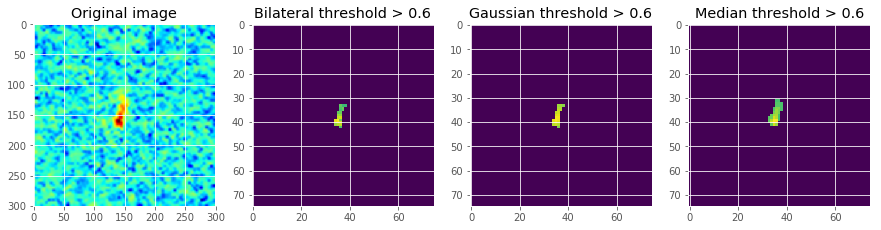

In [18]:
for i in range(20,25):
    arr = np.reshape(np.array(ex_shi.iloc[i,1]),(75,75))
    normalized = (arr-np.min(arr))/(np.max(arr)-np.min(arr))
    arr_uint = np.uint8(255*normalized)
    
    imgBL = to_RGB(arr)
    
    plt.figure(figsize=(15,10))
    
    plt.subplot(141)
    plt.imshow(imgBL)
    plt.title("Original image")
    
    plt.subplot(142)
    denoised_1 = skimage.restoration.denoise_bilateral(arr_uint, multichannel=False, sigma_color=0.1, sigma_spatial=10) 
    p = denoised_1 > 0.6
    plt.imshow(p*denoised_1)
    plt.title("Bilateral threshold > 0.6")
    
    plt.subplot(143)
    denoised_2 = skimage.filters.gaussian(arr_uint, sigma = 2) 
    p = denoised_1 > 0.6
    plt.imshow(p*denoised_2)
    plt.title("Gaussian threshold > 0.6")
    
    plt.subplot(144)                                          
    med = median(arr_uint, skimage.morphology.disk(2))
    p = med > 255*0.6
    plt.imshow(p*med)                                  
    plt.title("Median threshold > 0.6")
    
    plt.show()

En conclusion, le seuillage à 0.6 ne réagit pas très bien aux images fortement bruitées - et ce quels que soient les filtres, mais il semble bien conserver l'allure des objets pour des images moins bruitées comme la dernière. Nous essayons donc une nouvelle approche qui utilise aussi un filtre gaussien. On souhaite harmoniser vers le minimum d'intensité tout ce qui est identifié comme de la mer. On transforme l'image via une morphologie dans un premier temps; dans un second temps, pour isoler l'objet, on ne conserve que les pixels d'intensité en queue de distribution (on garde uniquement les plus lumineux). Ceci va nous permettre d'étudier plus facilement les formes et les tailles des objets.

#### Morphologie

On commence par appliquer la morphologie.

In [19]:
def morphologie(arr):
    image = img_as_float(np.reshape(np.array(arr), [75,75]))
    arr_uint = np.uint8(image)
    image = skimage.filters.gaussian(image, sigma = 1)
    seed = np.copy(image)
    seed[1:-1, 1:-1] = image.min()
    mask = image 
    dilated = skimage.morphology.reconstruction(seed, mask, method='dilation')
    return (image-dilated)

On conserve maintenant les intensités en queue de distribution.

In [20]:
def highest_intensity(arr):
    t = np.reshape(np.array(arr),[1,75*75])
    p = arr > np.mean(t) + 2*np.std(t)
    return (p*arr)  

On supprime les objets d'aires inférieures à celle de l'objet central. Sous l'hypothèse que les icebergs/bateaux sont centrés. 

In [21]:
def small_objects_removal(arr):
    
    t = np.reshape(np.array(arr),[1,75*75])
    p = arr > np.mean(t) + 2*np.std(t)
    
    label_img = skimage.measure.label(p)
    props = skimage.measure.regionprops(label_img) # référencement des différentes propriétés des objets de l'image
    centroid = [props[i].centroid for i in range(len(props))] # coordonnées des centroïds
    d_centre_centroid = [(centroid[i][0]-75/2)**2 + (centroid[i][1]-75/2)**2 for i in range(len(props))] # distances au centre de l'image
    central_object_index = d_centre_centroid.index(min(d_centre_centroid)) # indice dans props de l'objet central
    a = props[central_object_index].area # aire de l'objet central
    
    q = skimage.morphology.remove_small_objects(p, min_size=a, connectivity=1, in_place=False) # suppression des petits objets

    return (q*arr)

Testons sur les mêmes images que précédemment.

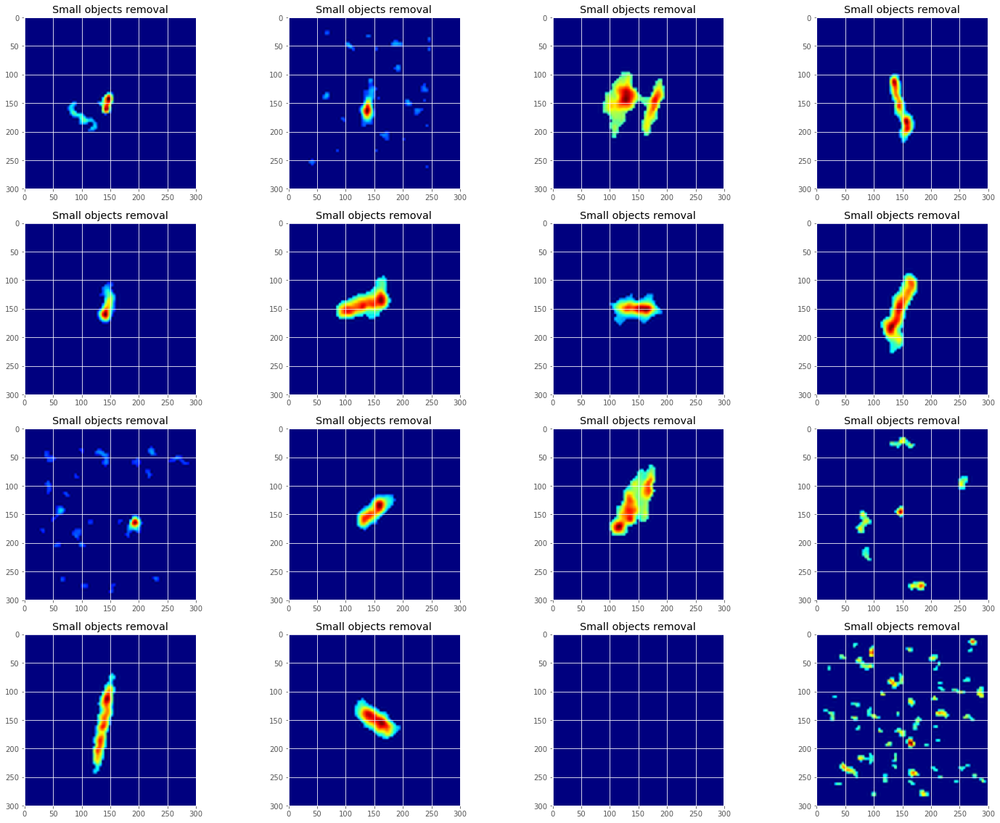

In [27]:
import warnings
warnings.filterwarnings("ignore")

    
plt.figure(figsize=(25,20))
    
for i in range(20,20+16):

    
    arr = ex_shi.iloc[i,1]
    img = np.reshape(np.array(arr),(75,75))
    normalized = (img-np.min(img))/(np.max(img)-np.min(img))
    arr_uint = np.uint8(255*normalized)
    #img = to_RGB(img)

    #plt.subplot()
    #plt.imshow(img)
    #plt.title("Original image")

    im = morphologie(arr)
    im1 = highest_intensity(im)
    
    plt.subplot(4,4,i-19)
    im2 = small_objects_removal(im1)
    plt.imshow(to_RGB(im2))
    plt.title("Small objects removal")
    
    
plt.show()

Notre solution répond à notre problème : la forme des objets semble conservée, les images très bruitées (comme la dernière) sont bien gérées. Nous créons donc la fonction __iso__ (voir le code qui suit) qui regroupe l'ensemble des transformations précédentes. 

Nous faisons le choix de retourner les propriétés de l'objet ayant **l'intensité maximale** parmi les tous les objets des images, ceci après transformation. Nous voulons insister sur ce choix important : pour la suite du projet, nous souhaiterions ajouter les propriétés de l'objet étant le plus probablement l'iceberg ou le bateau. Il faut donc choisir (étant donnée l'image) parmi les objets restants (par exemple, 2 objets sur la deuxième image). Dans un premier temps, nous avons raisonner par rapport à l'objet __central__. En l'occurence, cette méthode n'est pas fiable puisque les images ne sont pas toujours parfaitement centrées. Ensuite nous avons raisonné par rapport à l'objet ayant __l'aire la plus grande__. Après transformation, nous avons fait le constat que la méthode n'étaient pas fiable pour identifier l'objet. Nous avons donc fait l'hypothèse que l'iceberg/bateau était l'objet avec __la plus grande intensité__. 

In [49]:
def iso(arr):
    
    ## Morphology
    image = img_as_float(np.reshape(np.array(arr), [75,75]))
    arr_uint = np.uint8(image)
    image = skimage.filters.gaussian(image, sigma = 1)
    seed = np.copy(image)
    seed[1:-1, 1:-1] = image.min()
    mask = image 
    dilated = skimage.morphology.reconstruction(seed, mask, method='dilation')
    new_arr = image-dilated
    
    
    ## Highest intensity
    t = np.reshape(np.array(new_arr),[1,75*75])
    p = new_arr > np.mean(t) + 2*np.std(t)
    new_arr = p*new_arr

    
    ## Small objects removal

    label_img = skimage.measure.label(p)

    props = skimage.measure.regionprops(label_img)
    centroid = [props[i].centroid for i in range(len(props))]
    d_centre_centroid = [(centroid[i][0]-75/2)**2 + (centroid[i][1]-75/2)**2 for i in range(len(props))] 
    central_object_index = int(d_centre_centroid.index(min(d_centre_centroid)))
    a = props[central_object_index].area
    
    l = 0
    
    while l == 0 :
        p = skimage.morphology.remove_small_objects(skimage.measure.label(p), min_size= a)
        props = skimage.measure.regionprops(skimage.measure.label(p), intensity_image = image)
        l = len(props)

    max_ints = [props[i].max_intensity for i in range(len(props))]
    main_object_index = int(max_ints.index(max(max_ints)))
    props_central_object = props[main_object_index]
    
    return (p*new_arr, props_central_object, l)

   
from tqdm import tqdm, tqdm_pandas
tqdm_pandas(tqdm())


data["iso1"] = data["band_1"].progress_apply(lambda x : iso(x)[0])
data["iso2"] = data["band_2"].progress_apply(lambda x : iso(x)[0])

data["props1"] = data["band_1"].progress_apply(lambda x : iso(x)[1])
data["props2"] = data["band_2"].progress_apply(lambda x : iso(x)[1])

data["nbBlocks1"] = data["iso1"].progress_apply(lambda x : iso(x)[2])
data["nbBlocks2"] = data["iso2"].progress_apply(lambda x : iso(x)[2])

data["morpho1"] = data["band_1"].progress_apply(morphologie)
data["morpho2"] = data["band_2"].progress_apply(morphologie)

0it [00:00, ?it/s]
1604it [00:08, 189.41it/s]
100%|█████████████████████████████████████████████████████████████████████████████| 1604/1604 [00:06<00:00, 261.40it/s]


## Ajout de variables

Maintenant que nous avons réussi à traiter les images et à isoler les objets de manière satisfaisante, nous pouvons travailler les variables. Il ne semble pas pertinent de travailler sur les pixels en tant que variables, l'idée est plutôt de trouver des statistiques d'intérêt pour l'apprentissage du modèle. On commence par s'intéresser à quelques statistiques descriptives.

### Variables descriptives simples

Un première chose simple est d'ajouter les variables descriptives de base (maximum, écart type, normes L1 et L2, moyenne, valeur médiane) pour chaque image. Remarquons qu'étant donné nos transformations, la valeur minimale des images n'est pas pertinente, puisque nous l'avons harmonisée à 0.

In [50]:
for label in [1,2]:
    data['max'+str(label)] = data['morpho'+str(label)].apply(np.max)
    data['std'+str(label)] = data['morpho'+str(label)].apply(np.std)
    data['mean'+str(label)] = data['morpho'+str(label)].apply(np.mean)
    data['med'+str(label)] = data['morpho'+str(label)].apply(np.median)
    data['L1norm'+str(label)] = data['morpho'+str(label)].apply(lambda x : np.linalg.norm(x,1))
    data['L2norm'+str(label)] = data['morpho'+str(label)].apply(lambda x : np.linalg.norm(x,2))

La fonction suivante permet simplement de tracer différents histogrammes. On peut alors observer le pouvoir de discrimination des variables.

In [51]:
def plot_var(data,var):

    minval, maxval = data[var+"1"].min(), data[var+"1"].max()
    fig1 = plt.figure(figsize = (20,5))
    fig1.suptitle('HV polarization, histogramme de la variable '+var, fontsize=25)
    plt.subplot(1,2,1)
    plt.hist(data[var+"1"].where(data.is_iceberg == 0) , range=[minval,maxval], bins=50,color='b',alpha=0.5,label='Ship')
    plt.xlim([minval,maxval])
    plt.xlabel(var)
    plt.legend()
    plt.subplot(1,2,2)
    plt.hist(data[var+"1"].where(data.is_iceberg == 1) , range=[minval,maxval], bins=50,color='r',alpha=0.5,label='Ice')
    plt.xlim([minval,maxval])
    plt.xlabel(var)
    plt.legend()

    minval, maxval = data[var+"2"].min(), data[var+"2"].max()
    fig2 = plt.figure(figsize = (20,5))
    fig2.suptitle('HH polarization, histogramme de la variable '+var, fontsize=25)
    plt.subplot(1,2,1)
    plt.hist(data[var+"2"].where(data.is_iceberg == 0) , range=[minval,maxval], bins=50,color='b',alpha=0.5,label='Ship')
    plt.subplot(1,2,2)
    plt.hist(data[var+"2"].where(data.is_iceberg == 1) , range=[minval,maxval], bins=50,color='r',alpha=0.5,label='Ice')

    plt.show()



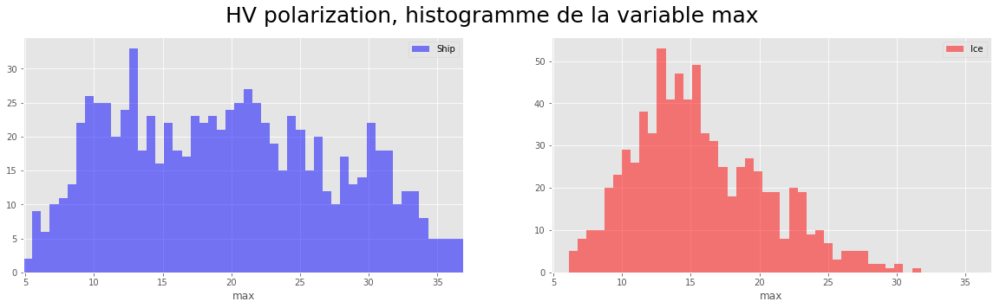

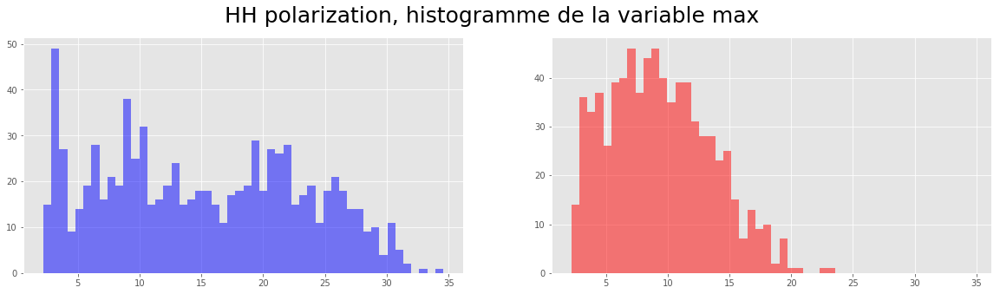

In [52]:
plot_var(data,"max")

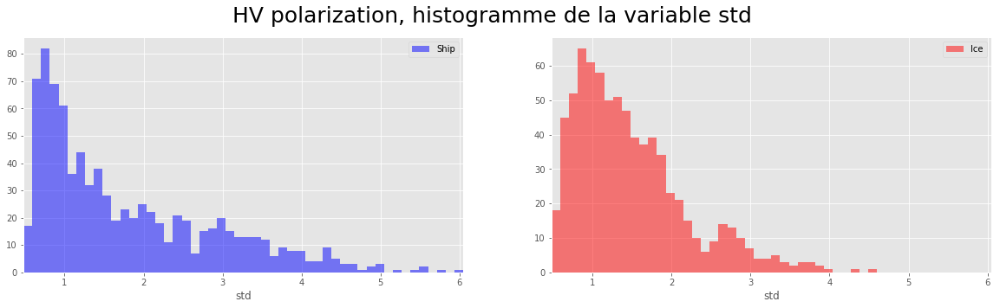

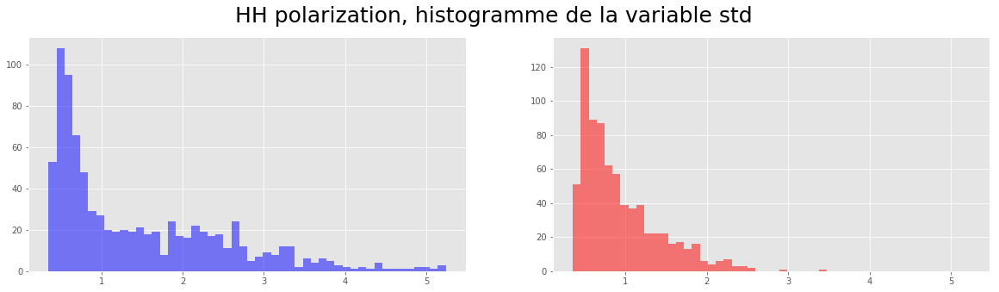

In [53]:
plot_var(data,"std")

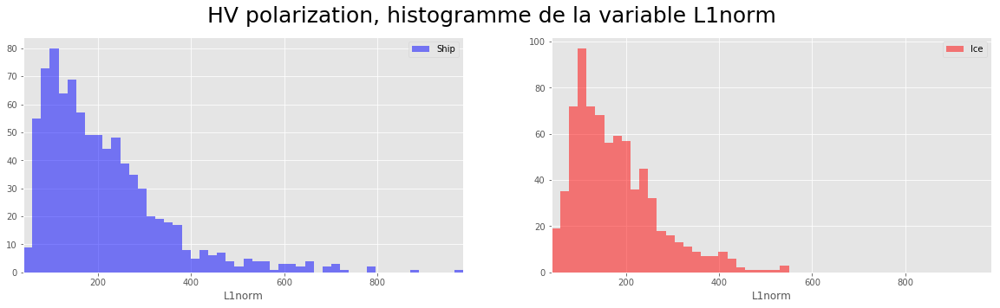

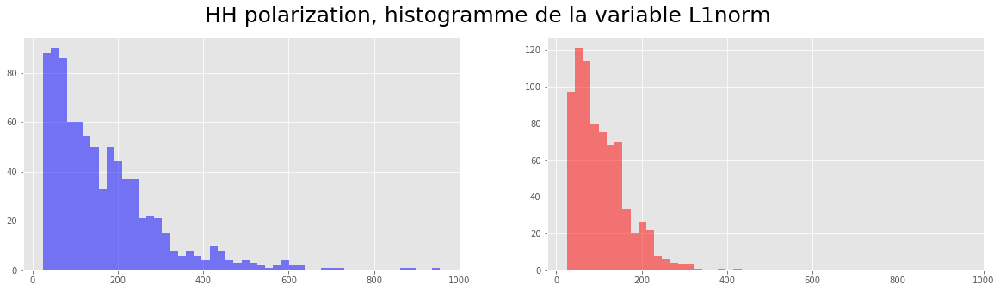

In [54]:
plot_var(data,"L1norm")

Il est très clair que certaines variables descriptives simples, notamment le maximum, seront utiles au modèle. On les ajoute donc à la base de données.

### Autres variables 

#### Caractéristiques des objets

On peut penser qu'un bon indicateur de la nature des objets est sa taille, une manière simple (mais très approximative) d'estimer la taille des objets est de calculer le nombre de pixels non identifiés comme de la mer. Rappelons que l'on a harmonisé l'intensité du niveau de la mer à 0. La fonction __iso__, étudiée en section précédente nous a permis non seulement d'isoler l'objet (iceberg ou bateau) mais aussi de calculer certaines de ses caractéristiques. On les utilise bien sûr pour notre modèle.

Les caractéristiques retenues dont donc : 
* *size* : l'aire de l'objet
* *perimeter* : le périmètre de l'objet
* *major_axis_length* : le plus grand rayon de l'ellipse entourant l'objet
* *minor_axis_length* : le plus petit rayon de l'ellipse entourant l'objet
* *inertia_tensor_h_eigvals* : la plus grande valeur propre du tenseur d'inertie
* *inertia_tensor_l_eigvals* : la plus petite valeur propre du tenseur d'inertie
* *moments* : le vecteur des moments

On ajoute à cela *maj_min_ratio* le rapport entre *major_axis_length* et *minor_axis_length*, on peut en effet imaginer que les icebergs vont être des objets qui vont avoir tendance à être plutôt rond donc avec un rapport proche de 1 et les bateaux vont être des objets plutôt étendus (rectangulaires) avec des rapports plus grands.

In [55]:
for lbl in [1,2]:
    data['size'+str(lbl)] = data['props'+str(lbl)].progress_apply(lambda x : x.area)
    data['perimeter'+str(lbl)] = data['props'+str(lbl)].progress_apply(lambda x : x.perimeter)
    data['major_axis_length'+str(lbl)] = data['props'+str(lbl)].progress_apply(lambda x : x.major_axis_length)
    data['minor_axis_length'+str(lbl)] = data['props'+str(lbl)].progress_apply(lambda x : x.minor_axis_length)
    data['orientation'+str(lbl)] = data['props'+str(lbl)].progress_apply(lambda x : x.orientation)
    data['inertia_tensor_h_eigvals'+str(lbl)] = data['props'+str(lbl)].progress_apply(lambda x : x.inertia_tensor_eigvals[0])
    data['inertia_tensor_l_eigvals'+str(lbl)] = data['props'+str(lbl)].progress_apply(lambda x : x.inertia_tensor_eigvals[1])
    data['moments'+str(lbl)] = data['props'+str(lbl)].progress_apply(lambda x : x.moments)
    data['moments_hu'+str(lbl)] = data['props'+str(lbl)].progress_apply(lambda x : x.moments_hu)
    data['maj_min_ratio'+str(lbl)] = data['major_axis_length'+str(lbl)]/data['minor_axis_length'+str(lbl)]

100%|███████████████████████████████████████████████████████████████████████████| 1604/1604 [00:00<00:00, 19091.31it/s]


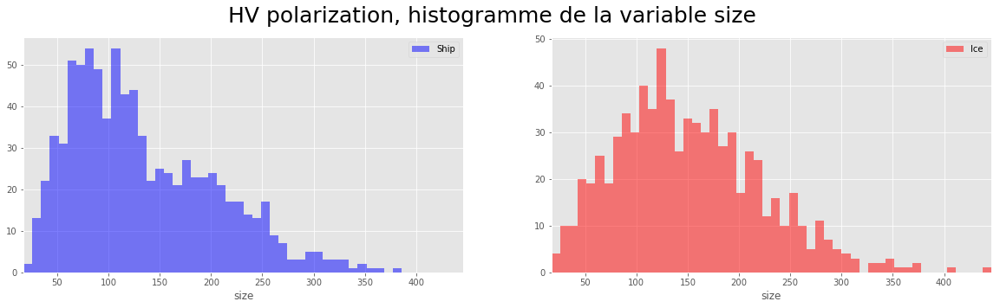

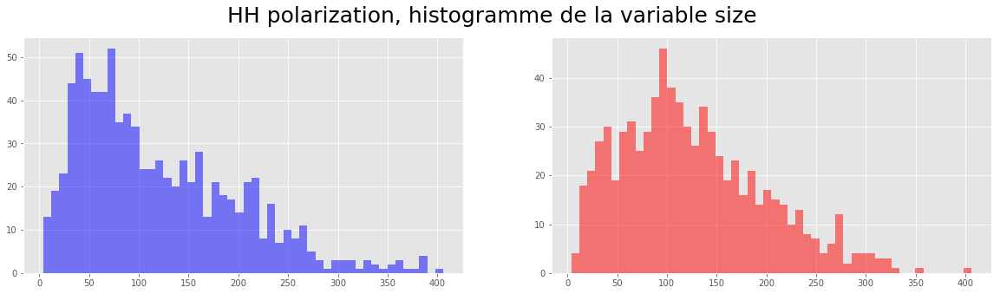

In [56]:
plot_var(data,"size")

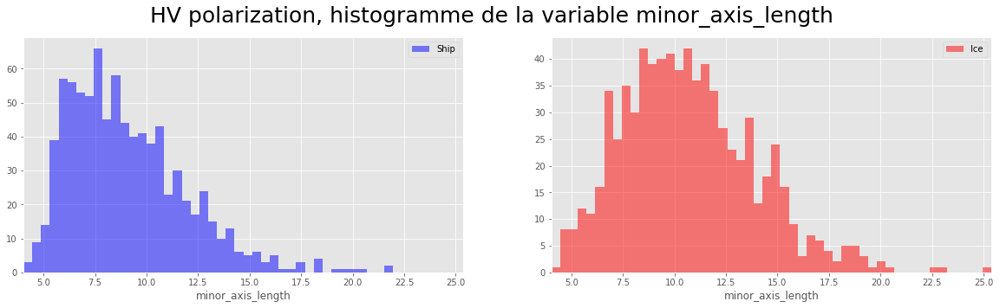

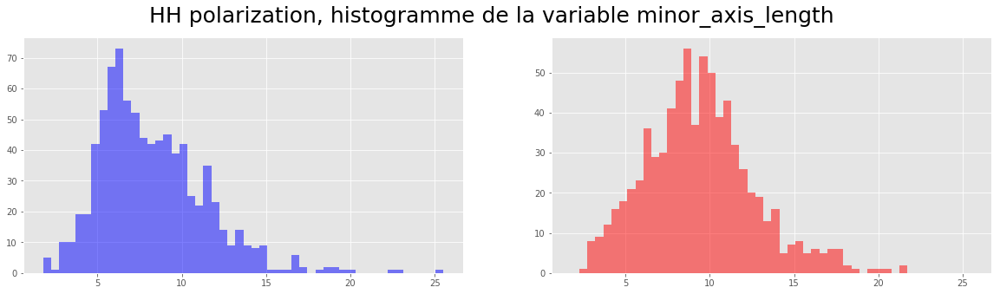

In [57]:
plot_var(data,"minor_axis_length")

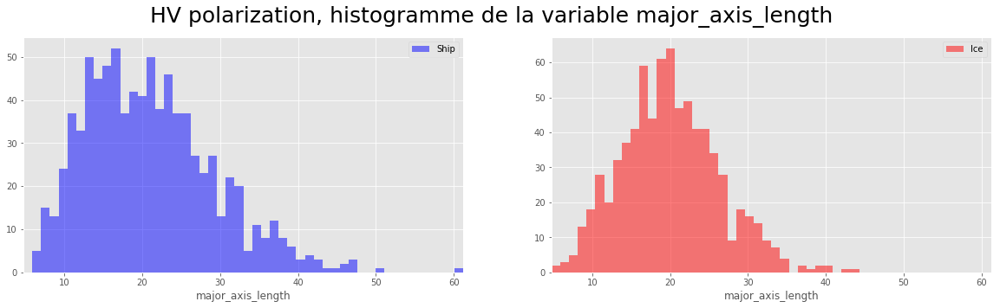

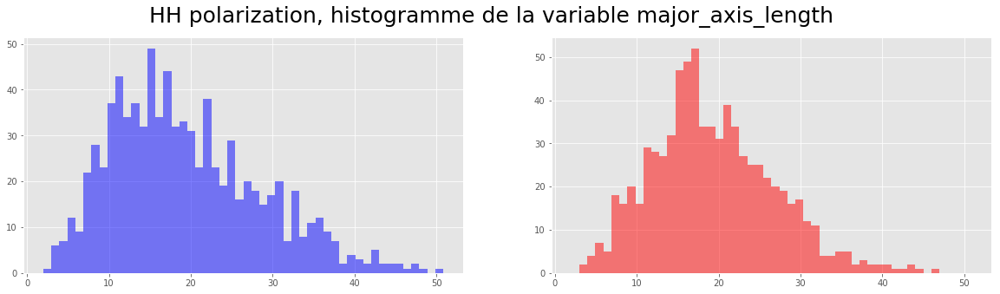

In [58]:
plot_var(data,"major_axis_length")

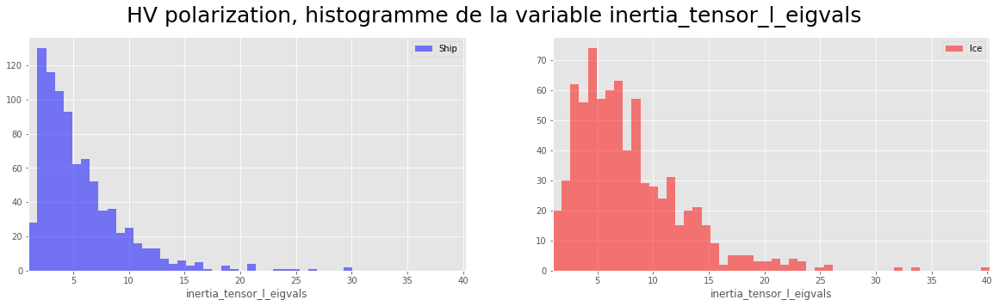

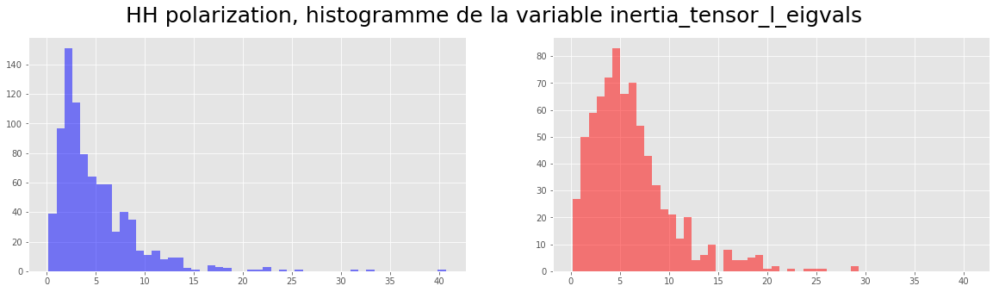

In [59]:
plot_var(data,"inertia_tensor_l_eigvals")

### Analyse en composante principale

Enfin, le problème des données brutes utilisées dans l'introduction était que beaucoup de pixels n'avaient pas d'interêt, on peut cependant supposer que certains d'entre eux (ou certaines combinaisons) sont néanmoins déterminants pour les modèles. On décide donc d'appliquer une PCA sur les données brutes et de garder les variables de plus grande variance expliquée.

In [60]:
n=data.shape[0]

In [61]:
def resize(arr):
    return np.reshape(arr,(75*75))

b1 = data["iso1"].progress_apply(resize)
b2 = data["iso2"].progress_apply(resize)
b = [np.concatenate((b1[i],b2[i])) for i in range(n)]
np.shape(b)

100%|██████████████████████████████████████████████████████████████████████████| 1604/1604 [00:00<00:00, 200568.33it/s]


(1604, 11250)

In [62]:
from sklearn.decomposition import PCA
pca = PCA(n_components=15)
XP = pca.fit_transform(b)

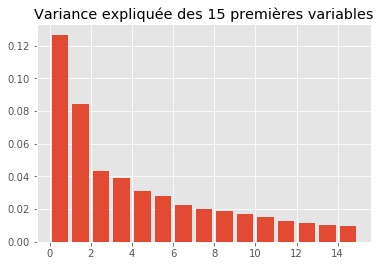

In [63]:
plt.bar(np.arange(len(pca.explained_variance_ratio_))+0.5, pca.explained_variance_ratio_)
plt.title("Variance expliquée des 15 premières variables")

plt.figure(figsize=(18,6))
plt.show()

## Apprentissage

On a travaillé sur les données dans les sections précédentes. On va maintenant essayer de trouver un modèle de classification à partir de ces données. L'objectif est d'obtenir des résultats significativement meilleurs qu'avec le modèle brut. On crée notre base de données __X__ à partir de la base d'origine, __data__.

In [84]:
import pandas as pd

X = pd.DataFrame()
IMG = pd.DataFrame()

# On ne conserve que les variables les plus importantes déduites des études précédentes

    
for i in [1,2]:
    X['max'+str(i)] = data['max'+str(i)]
    X['std'+str(i)] = data['std'+str(i)]
    X['size'+str(i)] = data['size'+str(i)]
    X['mean'+str(i)] = data['mean'+str(i)]
    X['med'+str(i)] = data['med'+str(i)]
    X['L1norm'+str(i)] = data['L1norm'+str(i)]
    X['perimeter'+str(i)] = data['perimeter'+str(i)]
    X['major_axis_length'+str(i)] = data['major_axis_length'+str(i)]
    X['minor_axis_length'+str(i)] = data['minor_axis_length'+str(i)]
    X['maj_min_ratio'+str(i)] = data['maj_min_ratio'+str(i)]
    X['inertia_tensor_l_eigvals'+str(i)] = data['inertia_tensor_l_eigvals'+str(i)]
    X['inertia_tensor_h_eigvals'+str(i)] = data['inertia_tensor_h_eigvals'+str(i)]
    X['iso'+str(i)] = data['iso'+str(i)]

    # On ajoute également le carré des variables précédentes au modèle
    X['max_c'+str(i)] = X['max'+str(i)]**2
    X['mean_c'+str(i)] = X['mean'+str(i)]**2
    X['med_c'+str(i)] = X['med'+str(i)]**2
    X['size_c'+str(i)] = X['size'+str(i)]**2
    X['perimeter_c'+str(i)] = X['perimeter'+str(i)]**2
    X['std_c'+str(i)] = X['std'+str(i)]**2
    X['major_axis_length_c'+str(i)] = X['major_axis_length'+str(i)]**2
    X['minor_axis_length_c'+str(i)] = X['minor_axis_length'+str(i)]**2
    X['maj_min_ratio_c'+str(i)] = X['maj_min_ratio'+str(i)]**2

for i in range(15):
    X['PCA'+str(i)]=XP[:,i]


X['inc_angle'] = data['inc_angle']
X['is_iceberg'] = data["is_iceberg"]
X['inc_angle'] = pd.to_numeric(X['inc_angle'],errors='coerce')
X = X.dropna()

Y = X['is_iceberg']
X = X.drop(["is_iceberg"],axis=1)

IMG['iso1'] = X['iso1']
IMG['iso2'] = X['iso2']
X = X.drop(['iso1'],axis=1)
X = X.drop(['iso2'],axis=1)

Xdf = X

Bien sûr on commence par séparer nos données en une base de test (permettant de valider le modèle) et une base d'entraînement. On normalise aussi les données, en effet certains classifieurs sont sensibles aux grandes valeurs, il est toujours préférable de travailler sur des données normalisées.

In [65]:
from sklearn import preprocessing
from sklearn.metrics import log_loss
from sklearn.model_selection import train_test_split
X = preprocessing.scale(X)
X_train, X_test, y_train, y_test = train_test_split(X, Y, test_size=0.25)

Dans les sections suivantes, on essaye d'ajuster les hyperparamètres de trois types de classifieurs : SVM, Neural Networks et K-nearest neighbors (le choix des classifieurs est tout à fait arbitraire). On estime la performance de chaque modèle via validation croisée, on estime ensuite les performances globales sur la base de test. Remarquons que la métrique est utilisée pour comparer les modèles est l'*Accuracy*, on pourrait aussi utiliser le *F1score* plus robuste. Cependant, la base de données étant assez équilibrée, les résultats sur les deux métriques étaient très similaires.

### SVM

In [66]:
from sklearn.model_selection import cross_val_score
best_c = None
best_s = 0

# SVM
from sklearn import svm

# Linear SVM
k='linear'
for j in range(8):
    clf = svm.SVC(kernel=k, C=10**(j-5), probability=True)
    scores = cross_val_score(clf, X_train, y_train, cv=5)
    if scores.mean()>best_s:
        best_s=scores.mean()
        best_c=clf
        print("Accuracy: %0.2f (+/- %0.2f)" % (scores.mean(), scores.std() * 2))


Accuracy: 0.52 (+/- 0.00)
Accuracy: 0.56 (+/- 0.02)
Accuracy: 0.80 (+/- 0.03)
Accuracy: 0.87 (+/- 0.05)


In [67]:
# rbf SVM
k='rbf'
for j in range(10):
    for i in range(10):
        clf = svm.SVC(kernel=k, C=10**((j-2)/2),gamma=1/n*10**((i-4)/2), probability=True)
        scores = cross_val_score(clf, X_train, y_train, cv=5)
        if scores.mean()>best_s:
            best_s=scores.mean()
            best_c=clf
            print("Accuracy: %0.2f (+/- %0.2f)" % (scores.mean(), scores.std() * 2))

Accuracy: 0.87 (+/- 0.04)
Accuracy: 0.87 (+/- 0.03)
Accuracy: 0.88 (+/- 0.02)
Accuracy: 0.88 (+/- 0.02)
Accuracy: 0.89 (+/- 0.04)


In [68]:
# poly SVM
k='poly'
for j in range(10):
    for i in range(8):
        clf = svm.SVC(kernel=k, C=10**((j-1)/2),degree=i+1, probability=True)
        scores = cross_val_score(clf, X_train, y_train, cv=5)
        if scores.mean()>best_s:
            best_s=scores.mean()
            best_c=clf
            print("Accuracy: %0.2f (+/- %0.2f)" % (scores.mean(), scores.std() * 2))

In [69]:
print("meilleur classifieur SVM")
best_c

meilleur classifieur SVM


SVC(C=316.22776601683796, cache_size=200, class_weight=None, coef0=0.0,
  decision_function_shape=None, degree=3, gamma=0.0019714948006037277,
  kernel='rbf', max_iter=-1, probability=True, random_state=None,
  shrinking=True, tol=0.001, verbose=False)

In [70]:
best_c_SVM = best_c
best_c_SVM = best_c_SVM.fit(X_train,y_train)

print("Accuracy calculée sur la base test : %0.2f"% best_c_SVM.score(X_test,y_test))
print("Log-loss calculée sur la base test : %0.2f"% log_loss(y_test,best_c_SVM.predict(X_test)))
print("Accuracy calculée sur la base d'entrainement : %0.2f"% best_c_SVM.score(X_train,y_train))
print("Log-loss calculée sur la base d'entrainement : %0.2f"% log_loss(y_train,best_c_SVM.predict(X_train)))

Accuracy calculée sur la base test : 0.88
Log-loss calculée sur la base test : 4.05
Accuracy calculée sur la base d'entrainement : 0.95
Log-loss calculée sur la base d'entrainement : 1.75


### Gradient Boost Classifier

In [78]:
from sklearn.ensemble import GradientBoostingClassifier

best_c = None
best_s = 0

for j in range(5,100):
    clf = GradientBoostingClassifier(n_estimators=i)
    scores = cross_val_score(clf, X_train, y_train, cv=5)
    if scores.mean()>best_s:
        best_s=scores.mean()
        best_c=clf
        print("Accuracy: %0.2f (+/- %0.2f)" % (scores.mean(), scores.std() * 2))

Accuracy: 0.80 (+/- 0.05)
Accuracy: 0.80 (+/- 0.05)


In [79]:
best_c_GBC = best_c
best_c_GBC = best_c_GBC.fit(X_train,y_train)

print("Accuracy calculée sur la base test : %0.2f"% best_c_GBC.score(X_test,y_test))
print("Log-loss calculée sur la base test : %0.2f"% log_loss(y_test,best_c_GBC.predict(X_test)))
print("Accuracy calculée sur la base d'entrainement : %0.2f"% best_c_GBC.score(X_train,y_train))
print("Log-loss calculée sur la base d'entrainement : %0.2f"% log_loss(y_train,best_c_GBC.predict(X_train)))

Accuracy calculée sur la base test : 0.79
Log-loss calculée sur la base test : 7.25
Accuracy calculée sur la base d'entrainement : 0.86
Log-loss calculée sur la base d'entrainement : 4.98


L'avantage du Gradient Boost Classifier est que l'on peut afficher et classer l'importance des variables. On voit ici que les caractéristiques des objets que l'on a extraits permet davantage de dicriminer les icebergs des bateaux.

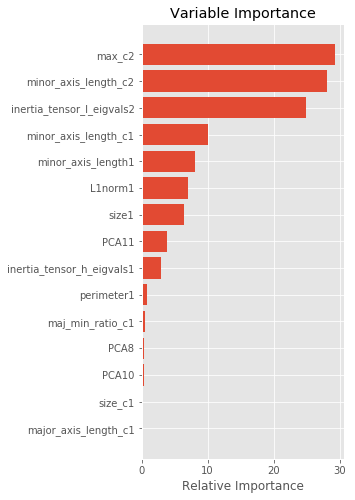

In [89]:
feature_name = Xdf.columns

limit = -1
feature_importance = best_c_GBC.feature_importances_[:limit]

feature_importance = 100.0 * (feature_importance / feature_importance.max())
sorted_idx = np.argsort(feature_importance)
sorted_idx = sorted_idx[limit-15:limit]
pos = np.arange(sorted_idx.shape[0]) + .5
fig = plt.figure(figsize = (8,8))
plt.subplot(1, 2, 2)
plt.barh(pos, feature_importance[sorted_idx], align='center')
plt.yticks(pos, feature_name[sorted_idx])
plt.xlabel('Relative Importance')
plt.title('Variable Importance')
plt.show()

### Neural Network

In [65]:
from sklearn.neural_network import MLPClassifier

best_c=None
best_s=0

for i in range(5):
    for j in range(5):
        for k in range(5):
            clf = MLPClassifier(solver='lbfgs', hidden_layer_sizes=(70+10*(i+1),70+10*(i+1)), random_state=1,alpha=10**(-4-k))
            scores = cross_val_score(clf, X_train, y_train, cv=5)
            if scores.mean()>best_s:
                best_s=scores.mean()
                best_c=clf
                print("Accuracy: %0.2f (+/- %0.2f)" % (scores.mean(), scores.std() * 2))

Accuracy: 0.86 (+/- 0.03)
Accuracy: 0.87 (+/- 0.02)
Accuracy: 0.87 (+/- 0.03)
Accuracy: 0.87 (+/- 0.02)
Accuracy: 0.87 (+/- 0.03)


In [66]:
print("meilleur classifieur Neural Network")
best_c

meilleur classifieur Neural Network


MLPClassifier(activation='relu', alpha=1e-07, batch_size='auto', beta_1=0.9,
       beta_2=0.999, early_stopping=False, epsilon=1e-08,
       hidden_layer_sizes=(100, 100), learning_rate='constant',
       learning_rate_init=0.001, max_iter=200, momentum=0.9,
       nesterovs_momentum=True, power_t=0.5, random_state=1, shuffle=True,
       solver='lbfgs', tol=0.0001, validation_fraction=0.1, verbose=False,
       warm_start=False)

In [67]:
best_c_NN = best_c
best_c_NN = best_c_NN.fit(X_train,y_train)

print("Accuracy calculée sur la base test : %0.2f"% best_c_NN.score(X_test,y_test))
print("Log-loss calculée sur la base test : %0.2f"% log_loss(y_test,best_c_NN.predict(X_test)))
print("Accuracy calculée sur la base d'entrainement : %0.2f"% best_c_NN.score(X_train,y_train))
print("Log-loss calculée sur la base d'entrainement : %0.2f"% log_loss(y_train,best_c_NN.predict(X_train)))

Accuracy calculée sur la base test : 0.85
Log-loss calculée sur la base test : 5.33
Accuracy calculée sur la base d'entrainement : 1.00
Log-loss calculée sur la base d'entrainement : 0.00


### KNN

In [68]:
from sklearn.neighbors import KNeighborsClassifier
best_c=None
best_s=0

for i in range(4):
    clf = KNeighborsClassifier(n_neighbors=i+2)
    scores = cross_val_score(clf, X_train, y_train, cv=5)
    if scores.mean()>best_s:
        best_s=scores.mean()
        best_c=clf
        print("Accuracy: %0.2f (+/- %0.2f)" % (scores.mean(), scores.std() * 2))

Accuracy: 0.81 (+/- 0.04)
Accuracy: 0.84 (+/- 0.02)
Accuracy: 0.85 (+/- 0.03)


In [69]:
print("meilleur classifieur Neural Network")
best_c

meilleur classifieur Neural Network


KNeighborsClassifier(algorithm='auto', leaf_size=30, metric='minkowski',
           metric_params=None, n_jobs=1, n_neighbors=5, p=2,
           weights='uniform')

In [70]:
best_c_KNN = best_c
best_c_KNN = best_c_KNN.fit(X_train,y_train)

print("Accuracy calculée sur la base test : %0.2f"% best_c_KNN.score(X_test,y_test))
print("Log-loss calculée sur la base test : %0.2f"% log_loss(y_test,best_c_KNN.predict(X_test)))
print("Accuracy calculée sur la base d'entrainement : %0.2f"% best_c_KNN.score(X_train,y_train))
print("Log-loss calculée sur la base d'entrainement : %0.2f"% log_loss(y_train,best_c_KNN.predict(X_train)))

Accuracy calculée sur la base test : 0.82
Log-loss calculée sur la base test : 6.33
Accuracy calculée sur la base d'entrainement : 0.90
Log-loss calculée sur la base d'entrainement : 3.44


## Résultats de l'apprentissage

Comme on pouvait s'y attendre, les résultats sont assez similaires quels que soient les classifieurs utilisés, l'ajustement des hyperparamètres permet de gagner en score assez faiblement. L'important a été le travail sur les données. On peut être assez satisfait des résultats obtenus. En effet avec les nouvelles variables obtenus via le travail sur les images nous avons réussi à améliorer significativement l'*accuracy* du modèle. Après validation, l'accuracy est d'environ 0.85 soit un gain de __0.1__. On remarque aussi que les temps d'apprentissage ont diminué. Le modèle brut avait un temps d'apprentissage autour de 1 minute on passe ici à __1 seconde__ environ.

Ci dessous, on trace les courbes ROC pour les modèles retenus des trois différents classifieurs.

Area under the ROC curve - model SVM : 0.947827
Area under the ROC curve - model NN : 0.921010
Area under the ROC curve - model KNN : 0.927742


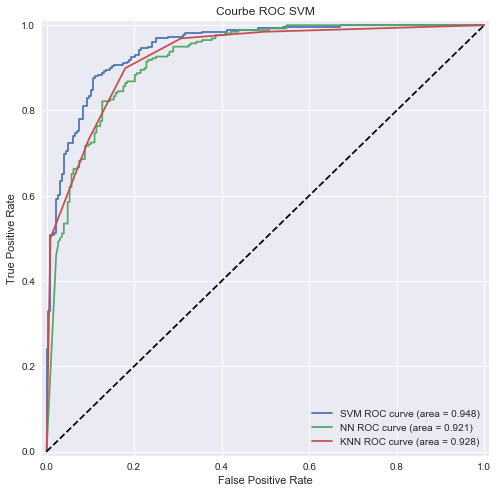

In [356]:
from sklearn.metrics import roc_curve, auc

fig = plt.figure(figsize = (8,8))
for model in ["SVM", "NN", "KNN"] : 
    if model == "SVM":
        probas = best_c_SVM.predict_proba(X_test)
    elif model == "NN" : 
        probas = best_c_NN.predict_proba(X_test)
    else : 
        probas = best_c_KNN.predict_proba(X_test)

    fpr, tpr, thresholds = roc_curve(y_test.ravel(), probas[:, 1])
    roc_auc = auc(fpr, tpr)
    print ("Area under the ROC curve - model "+model+" : %f" % roc_auc)

    plt.plot(fpr, tpr, label= model + ' ROC curve (area = %0.3f)' % roc_auc)
    plt.title('Courbe ROC")
    
plt.plot([0, 1], [0, 1], 'k--')
plt.xlim([-0.01, 1.01])
plt.ylim([-0.01, 1.01])
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.legend(loc="lower right")

plt.show()

Sur les trois courbes ROC ci-dessus, nous constatons que le classifieur SVM possède le meilleur pouvoir prédictif puisque tout point de sa courbe est au-dessus des deux autres. La domination est stricte. 

On s'intéresse aussi aux différentes matrices de confusion

 MODEL AVEC CLASSIFIEUR SVM :

Confusion sur X_test : 
 [[ 0.4012  0.107 ]
 [ 0.0432  0.4486]]


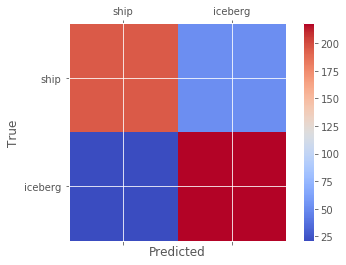

 MODEL AVEC CLASSIFIEUR NN :

Confusion sur X_test : 
 [[ 0.4239  0.0844]
 [ 0.07    0.4218]]


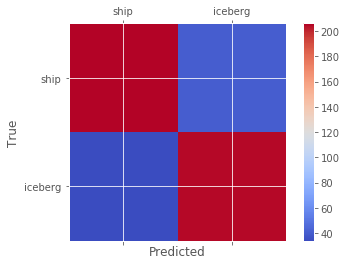

 MODEL AVEC CLASSIFIEUR KNN :

Confusion sur X_test : 
 [[ 0.3848  0.1235]
 [ 0.0597  0.4321]]


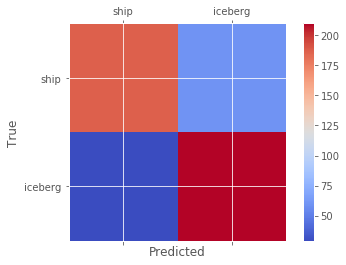

In [73]:
from sklearn.metrics import confusion_matrix
from matplotlib import cm

labels = ['ship', 'iceberg']

for model in ["SVM", "NN", "KNN"]:
    if model == "SVM":
        best_c = best_c_SVM
    elif model == "NN" : 
        best_c = best_c_NN
    else : 
        best_c = best_c_KNN
      
    print(" MODELE AVEC CLASSIFIEUR " + model + " :\n")
    i = 0
    for x,y in [(X_test, y_test) ]:
        i += 1
        yp  = best_c.predict(x)
        cmx = confusion_matrix(y, yp)
        cm_norm = np.around(cmx / np.sum(cmx),4)

        print("Confusion sur X_test : \n " +str(cm_norm))

        
    fig = plt.figure()
    ax = fig.add_subplot(111)
    cax = ax.matshow(cmx, cmap=cm.coolwarm)
    fig.colorbar(cax)
    ax.set_xticklabels([''] + labels)
    ax.set_yticklabels([''] + labels)
    plt.xlabel('Predicted')
    plt.ylabel('True')
    plt.show()

L'exploitation des matrices de confusion est très intéressante. On retient les résultats suivants :
* On reconnaît toujours mieux les icebergs, pour les meilleurs modèles, en moyenne, 44% des icebergs sont correctement prédits ;
* En majorité les erreurs de prédictions consistent à prendre les bateaux pour des icebergs.

Les images suivantes montrent les erreurs de prédiction :

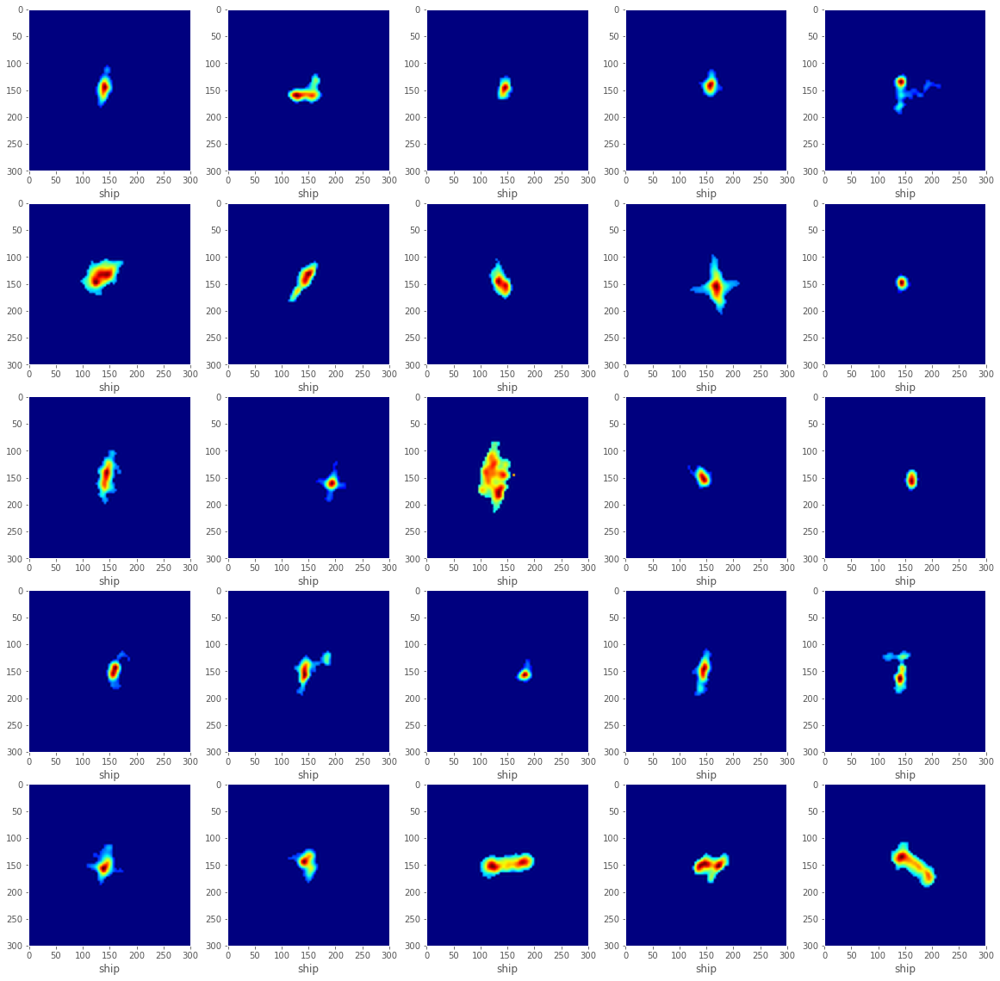

In [90]:
import random
pred = best_c_SVM.predict(X_test)
IMG1=np.array(IMG['iso1'])
yt=np.array(y_test)
# contient l'indice (numéro d'observation) des erreurs
ind_err=[]
for i in range(1,len(yt)):
    if yt[i]!=pred[i]:
        ind_err.append(i)
n_e=len(ind_err)

fig = plt.figure(figsize = (20,20))

for j in range(0,5):
    for i in range(1,6):  
        ax = fig.add_subplot(5,5,i+j*5)
        arr = IMG1[i+j*5-1]
        im = to_RGB(arr)
        ax.grid(False)
        ax.imshow(im)
        if yt[temp]==1:
            ax.set_xlabel("iceberg")
        else :
            ax.set_xlabel("ship")

plt.show()
    

On ne repère aucune caractèristique spéciale ni d'anormalité (du type image très bruitée, image vide...) dans les erreurs de prédiction. Il s'agit effectivement d'images qui sont très difficiles à différentier souvent des petits objets ronds donc difficilement discriminables. De même il y a beaucoup d'erreurs dans les grands objets assez étendus.

On remarque tout de même un phénomène de réverberation sur certains bateaux, mal interprété par le classifieur. L'ajout d'une variable indicatrice de ces traînées lumineuses permettrait de réduire l'erreur de prédiction sur les bateaux.

## Réseau de neurones sous Keras

In [291]:
train = refresh()

# On génère la base de train en créant 3 bandes : band_1, band_2 et la somme des deux

X_band_1=np.array([np.array(band).astype(np.float32).reshape(75, 75) for band in train["band_1"]])
X_band_2=np.array([np.array(band).astype(np.float32).reshape(75, 75) for band in train["band_2"]])
X_train = np.concatenate([X_band_1[:, :, :, np.newaxis], X_band_2[:, :, :, np.newaxis],((X_band_1+X_band_2)/2)[:, :, :, np.newaxis]], axis=-1)

In [294]:
from keras.preprocessing.image import ImageDataGenerator
from keras.models import Sequential
from keras.layers import Conv2D, MaxPooling2D, Dense, Dropout, Input, Flatten, Activation
from keras.layers import GlobalMaxPooling2D
from keras.layers.normalization import BatchNormalization
from keras.layers.merge import Concatenate
from keras.models import Model
from keras import initializers
from keras.optimizers import Adam
from keras.callbacks import ModelCheckpoint, Callback, EarlyStopping

Using TensorFlow backend.


In [295]:
# On implémente le modèle

def getModel():
    
    gmodel=Sequential()
    
    # Filtre de convolution+maxpooling n°1
    gmodel.add(Conv2D(64, kernel_size=(3, 3),activation='relu', input_shape=(75, 75, 3)))
    gmodel.add(MaxPooling2D(pool_size=(3, 3), strides=(2, 2)))
    gmodel.add(Dropout(0.2))

    # Filtre de convolution+maxpooling n°2
    gmodel.add(Conv2D(128, kernel_size=(3, 3), activation='relu' ))
    gmodel.add(MaxPooling2D(pool_size=(2, 2), strides=(2, 2)))
    gmodel.add(Dropout(0.2))

    # Filtre de convolution+maxpooling n°3
    gmodel.add(Conv2D(128, kernel_size=(3, 3), activation='relu'))
    gmodel.add(MaxPooling2D(pool_size=(2, 2), strides=(2, 2)))
    gmodel.add(Dropout(0.2))

    # Filtre de convolution+maxpooling n°4
    gmodel.add(Conv2D(64, kernel_size=(3, 3), activation='relu'))
    gmodel.add(MaxPooling2D(pool_size=(2, 2), strides=(2, 2)))
    gmodel.add(Dropout(0.2))

    # On aplatit les données pour appliquer les filtres de densité
    gmodel.add(Flatten())

    # Dense Layer 1
    gmodel.add(Dense(512))
    gmodel.add(Activation('relu'))
    gmodel.add(Dropout(0.2))

    # Dense Layer 2
    gmodel.add(Dense(256))
    gmodel.add(Activation('relu'))
    gmodel.add(Dropout(0.2))

    # Enfin on applique un Sigmoid Layer
    gmodel.add(Dense(1))
    gmodel.add(Activation('sigmoid'))

    mypotim=Adam(lr=0.001, beta_1=0.9, beta_2=0.999, epsilon=1e-08, decay=0.0)
    gmodel.compile(loss='binary_crossentropy',
                  optimizer=mypotim,
                  metrics=['accuracy'])
    gmodel.summary()
    
    return gmodel


def get_callbacks(filepath, patience=2):
    es = EarlyStopping('val_loss', patience=patience, mode="min")
    msave = ModelCheckpoint(filepath, save_best_only=True)
    return [es, msave]

file_path = ".model_weights.hdf5"
callbacks = get_callbacks(filepath=file_path, patience=5)

In [296]:
target_train=train['is_iceberg']
X_train_cv, X_valid, y_train_cv, y_valid = train_test_split(X_train, target_train, random_state=1, train_size=0.75)

In [297]:
# On affiche les caractéristiques du réseau de neurones, puis on le lance.
import os
gmodel=getModel()
gmodel.fit(X_train_cv, y_train_cv,
          batch_size=24,
          epochs=50,
          verbose=1,
          validation_data=(X_valid, y_valid),
          callbacks=callbacks)

_________________________________________________________________
Layer (type)                 Output Shape              Param #   
conv2d_1 (Conv2D)            (None, 73, 73, 64)        1792      
_________________________________________________________________
max_pooling2d_1 (MaxPooling2 (None, 36, 36, 64)        0         
_________________________________________________________________
dropout_1 (Dropout)          (None, 36, 36, 64)        0         
_________________________________________________________________
conv2d_2 (Conv2D)            (None, 34, 34, 128)       73856     
_________________________________________________________________
max_pooling2d_2 (MaxPooling2 (None, 17, 17, 128)       0         
_________________________________________________________________
dropout_2 (Dropout)          (None, 17, 17, 128)       0         
_________________________________________________________________
conv2d_3 (Conv2D)            (None, 15, 15, 128)       147584    
__________

**Résultats du CNN**

In [298]:
gmodel.load_weights(filepath=file_path)
score = gmodel.evaluate(X_valid, y_valid, verbose=1)
print('Test loss:', score[0])
print('Test accuracy:', score[1])

401/401 [==============================] - 4s 10ms/step
Test loss: 0.277450355285
Test accuracy: 0.892768080395


On regarde également la matrice de confusion pour ce classifieur.

Model : CNN 
 

Test : 
 [[ 0.4763  0.054 ]
 [ 0.0283  0.4414]]
Test : 
 [[ 0.4663  0.0648]
 [ 0.0424  0.4264]]


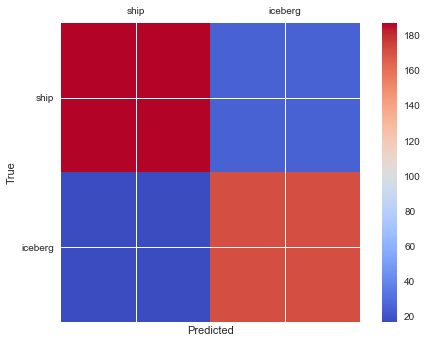

In [367]:
i = 0
labels = ['ship', 'iceberg']


print("Model : CNN \n \n")
for x,y in [ (X_train_cv, y_train_cv), (X_valid, y_valid) ]:
    i += 1
    predicted_test=gmodel.predict_proba(x)
    yp = predicted_test.reshape((predicted_test.shape[0]))
    ypp = []
    for i in range(len(yp)):
        if yp[i] > 0.5 :
            ypp.append(1)
        else :
            ypp.append(0)
            
    cmx = confusion_matrix(y, ypp)
    cm_norm = np.around(cmx / np.sum(cmx),4)
    
    if i == 1 : 
        print("Train : \n " +str(cm_norm))
    else :
        print("Test : \n " +str(cm_norm))

fig = plt.figure()
ax = fig.add_subplot(111)
cax = ax.matshow(cmx, cmap=cm.coolwarm)
fig.colorbar(cax)
ax.set_xticklabels([''] + labels)
ax.set_yticklabels([''] + labels)
plt.xlabel('Predicted')
plt.ylabel('True')
plt.show()

Il est intéressant de remarquer que contrairement aux modèles précédents, celui-ci est plus performant sur les bateaux.

## Conclusion

### Comparaison des modèles

On compare ici les deux principaux modèles de notre étude, à savoir le modèle avec classifieur SVM obtenu avec nos définitions de variables et le modèle obtenu via convutional neural network. Rappel des principaux résultats (performances de l'ordinateur : processeur 2 GHz Intel Core i7, mémoire RAM 8 Go 1600 MHz DDR3) :

<table>

   <thead> <!-- En-tête du tableau -->
       <tr>
           <th>Modèle</th>
           <th>Accuracy</th>
           <th>Log-loss</th>
           <th>Temps d'apprentissage</th>
       </tr>
   </thead>


   <tbody> <!-- Corps du tableau -->
       <tr>
           <td>Modèle base "brute"</td>
           <td>0.75</td>
           <td>10.02</td>
           <td>≈ 30 secondes</td>
       </tr>
       <tr>
           <td>SVM</td>
           <td>0.88</td>
           <td>4.05</td>
           <td>≈ 2 secondes</td>
       </tr>
       <tr>
           <td>CNN</td>
           <td>0.89</td>
           <td>0.27</td>
           <td>≈ 30 minutes (≈ 1min/epoch)</td>
       </tr>
   </tbody>
</table>

Ce qui différencie profondément nos modèles est le caractère "boîte noire" du CNN. En dépis du fait que nous sélectionnons le nombre, l'enchaînement et la nature des filtres / couches appliqués aux images, nous ne maîtrisons pas réellement les variables avec lesquelles nous travaillons, si ce n'est à notre niveau. Au contraire, les modèles précédents sont plus simples et toutes les variables ont du sens pour le problème. Avec le CNN, nous pouvons travailler directement avec les données brutes (et nettoyées au préalable par l'entreprise), tout le travail sur l'image se fait directement via le classifieur... 

Le modèle avec CNN reste néanmoins plus performant que les autres modèles dérivés dans ce rapport. L'accuracy est  légèrement meilleure et la log-loss (métrique utilisée pour le leader board de la compétition) est largement meilleure (un facteur 10 à 15). Cependant la simplicité des modèles que nous avons proposés implique un temps d'apprentissage très largement inférieur, le gros défaut étant le déséquilibre dans les prédictions, on se trompe davantage sur la reconnaissance des bateaux. Les probabilités avec lesquelles les valeurs sont prédites sont aussi souvent plus faibles.


Une approche que nous n'avons pas exploitée dans ce rapport est l'utilisation de réseaux de neurones pré-entraînés (RESNET ou VGG16). Il nous a semblé que l'idée pouvait être intéressante mais que les images de notre problème étaient peut-être trop spécialisées pour obtenir des résultats convaincants. Il serait tout de même intéressant d'effectuer quelques essais dans cette direction pour améliorer nos modèles actuels.

### Utilisation des modèles

Nos modèles sont-ils utilisables dans le contexte industriel du problème ? Il est certain que le modèle est beaucoup plus performant que l'utilisateur en terme de reconnaissance d'objets, il accomplit rapidement un travail d'expertise assez complexe. Est-il utilisable en tant que tel ? Étant donné les performances (autour de 0.88-0.90 d'accuracy), les deux modèles peuvent être utilisés dans le contexte industriel mentionné sur KAGGLE; le modèle peut-être livré tel quel à Statoil. Il s'agit ici d'un livrable commandé par un client, appliqué à leur jeu de données, et est donc difficilement industrialisable à une plus grande échelle. Rappelons que l'objectif de la compétition est de repérer les icebergs potentiellement dangereux pour les installations de l'entreprise. Si la décision d'évacuer une station pétrolière off-shore venait à dépendre d'un tel modèle, aussi performant soit-il, il est évident que ses prédictions devront être validées par un tiers compte tenu des enjeux. 

Dans le contexte du problème, il est important de ne pas prendre les icebergs pour des bateaux, puisqu'ils sont la cause du problème de Statoil, il est donc important de diminuer la proportion de faux positifs (peut-être trop élevée pour nos modèles, ce qui se voit au travers de la log-loss). Pour pallier au problème des faux positifs, on peut aussi fixer des seuils (pour les probabilités prédites) à partir desquels on pourra considérer que le risque de faux positif est trop élevé, et alors procéder à une étape de reconnaissance manuelle à l'aide d'outils supplémentaires. Par exemple, si la probabilité de prédiction d'un objet se situe entre 0.4 et 0.6, l'entreprise pourrait mettre en oeuvre une procédure sytématique de vérification. Par exemple, géolocaliser l'objet ou récupérer les informations de traffic maritime, s'assurer qu'il s'agit bien d'un bateau, et si pas, suivre la trajectoire de l'iceberg, définir une zone critique et prendre des mesures conséquentes en cas d'intrusion de l'iceberg dans la zone. Bien sûr, ces procédures existent et ont été réfléchies, mais doivent cependant s'adapter aux prédictions du modèle. Le but de ce problème de machine learning n'est pas de proposer une solution 0 coût, mais de réduire les coûts liés au maintien des conditions de sécurité. Plus la log-loss du classifieur est faible, plus sûr sera le modèle et plus les coûts seront réduits; mais cela ne peut se substituer intégralement à une vérification manuelle des objets. Toujours en terme de coûts financiers, le modèle n'a à priori pas de "durée de vie" dans la mesure où si la technologie de prise de vue n'évolue pas dans le temps, le problème reste le même.

L'intérêt du modèle est qu'il est susceptible de s'améliorer avec de nouvelles observations (nouvelles photos prises par le satellite), aucune modification n'est alors nécessaire, il faudra simplement relancer l'apprentissage, relativement rapide. On rappelle que le nombre d'observations pour la compétition est faible (1604) et que de plus grandes bases de données pourront améliorer la reconnaissance des objets. Cependant, agrandir la base de données d'entraînement signifie labelliser chaque image, ce qui est assez coûteux (et pas qu'en temps). Cependant le modèle est susceptible de passer correctement à l'échelle avec des bases de données significativement plus grandes. 

Enfin, comme nous l'avons dit, le modèle est difficilement utilisable dans d'autres contextes. En effet le traitement des images effectué ici est très spécifique aux images prises par le satellite Sentinel-1. On pourrait néanmoins utiliser le modèle pour travailler avec une plus grande variété d'images prises par ce même satellite. On peut penser reconnaître d'autres objets ou utiliser le modèle pour délimiter la mer et les objets en surface (création automatique de cartes ou observations d'îles). Dans un contexte écologique on peut aussi imaginer utiliser notre modèle pour repérer et identifier les amas de déchets qui s'agglutinent dans l'océan.